# <font color=2b7cb6> **Data Mining II - Budgeting For The Future** </font>
## <font color=4f9dd6> **Notebook 1: Data Preprocessing** </font>

<u>**Group 06**</u>

## <font color=72beea> **Imports** </font>

In [1]:
# To show all ouput that are in the same input cell (allow to run more than one function/method in the same cell)
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
%matplotlib inline
import warnings
warnings.simplefilter("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime, date
from sklearn.impute import KNNImputer, SimpleImputer
import math
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression, LassoCV, LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
path = '/content/drive/MyDrive/Homework_Group06/'

Mounted at /content/drive


## <font color=72beea> **1. Data Understanding** </font>

In [4]:
# Import train dataset
train_data = pd.read_csv(path + 'DM2_Project Datasets/train.csv')
train_data

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,...,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type
0,1,Stanley,Mr.,1992-01-03,Mining City,Data Land,0.0,1.9352,99.6431,9.7221,...,NaN,11.9772,9.9506,1.75750,23.0605,0.1776,0.6504,2.8850,106.2820,Travel Enthusiast
1,2,Višeslav,Mr.,2005-03-16,Mining City,Data Land,0.0,0.5672,125.1630,5.4308,...,13.6445,11.8776,5.1521,1.96770,NaN,1.2782,1.0190,3.5777,132.1210,Fitness Enthusiast
2,3,Rogerio,Mr.,2005-04-04,Mining City,Data Land,1.0,0.5613,105.2490,15.0829,...,5.8867,14.4247,3.6737,3.69071,37.5970,0.0354,3.0854,5.1906,115.5470,Health-Conscious
3,4,Jagat,Mr.,1981-09-25,Mining City,Data Land,0.0,0.3543,95.2219,16.3380,...,9.1074,12.3668,5.5798,1.57690,8.2142,1.7763,0.3677,NaN,101.7730,Fitness Enthusiast
4,5,Virgínio,Mr.,1987-07-29,Mining City,Data Land,0.0,0.5943,255.8600,148.2250,...,4.0892,15.8389,3.7712,1.95580,14.3443,0.0000,0.6718,2.7076,264.4510,Adventure Seeker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90160,90161,Salomé,Miss,1993-11-18,Mining City,Data Land,0.0,0.8188,288.7790,0.5000,...,9.5441,12.9497,5.0265,2.16390,44.7958,NaN,1.7052,NaN,296.9590,Investor
90161,90162,امیر,Mr.,1982-02-02,Mining City,Data Land,0.0,0.6033,15.6433,20.1930,...,8.9811,12.5240,5.0200,2.31650,95.1422,0.1997,0.7403,5.0756,22.6456,Investor
90162,90163,Murat,Mr.,1986-01-07,Mining City,Data Land,0.0,0.6710,96.3212,13.1624,...,5.1733,13.4334,12.9103,2.42090,48.7617,2.2265,2.4052,2.9948,105.4430,Fitness Enthusiast
90163,90164,Marius,Mr.,2003-04-20,Mining City,Data Land,0.0,0.5735,100.1350,16.2172,...,4.6034,10.2272,12.1893,1.50090,11.4332,2.9765,0.6275,2.1157,105.8760,Fitness Enthusiast


In [5]:
# Import test dataset
test_data = pd.read_csv(path + 'DM2_Project Datasets/test.csv')
test_data

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being
0,90166,Deniz,Mrs.,1987-03-23,Mining City,Data Land,NaN,0.6724,100.502,10.1762,1.7516,8.4129,15.1645,9.3925,2.2621,64.2378,0.0626,0.7672,4.9523,108.8510
1,90167,Saana,Mrs.,1966-10-19,Mining City,Data Land,0.0,0.5993,102.870,7.1811,0.0034,6.6384,15.3898,6.6101,1.8308,18.7592,0.5960,1.4061,2.5396,111.9710
2,90168,مرسانا,Miss,1989-03-05,Mining City,Data Land,0.0,0.6675,102.963,16.9708,2.3346,4.2747,12.7121,11.9248,1.7735,11.2036,1.3633,2.5570,2.6267,111.8760
3,90169,Ratimir,Mr.,1974-11-11,Mining City,Data Land,0.0,2.3741,101.108,11.3375,7.2085,14.3043,11.5065,3.6422,2.1187,48.5756,2.6768,0.8079,3.2889,107.6690
4,90170,Jamie,Mr.,1995-09-22,Mining City,Data Land,0.0,0.6015,100.780,4.8217,4.2585,6.3106,15.8794,7.8561,1.4942,31.5998,0.0000,1.0359,2.1572,109.7560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38638,128804,Judith,Miss,1982-04-18,Mining City,Data Land,0.0,3.5502,77.196,82.2283,7.9508,12.1804,14.2306,0.3488,0.9117,6.0649,0.7736,0.6914,0.5917,85.0027
38639,128805,Sebastian,Mr.,1984-08-31,Mining City,Data Land,0.0,0.4119,103.695,8.1052,0.5497,3.4697,13.0287,13.0047,2.5738,47.5229,0.0916,0.5581,NaN,110.7680
38640,128806,Raul,Mr.,1991-06-09,Mining City,Data Land,0.0,1.1734,108.113,112.5690,6.7662,10.8467,10.8360,1.7053,1.6949,15.0828,1.3528,0.9627,2.0481,114.4940
38641,128807,Warren,Mr.,1990-09-02,Mining City,Data Land,NaN,0.6245,101.124,12.3346,7.4374,8.0149,11.4312,NaN,1.7391,36.5346,0.0000,1.2295,2.9396,108.0690


In [6]:
train_data.shape
test_data.shape

(90165, 21)

(38643, 20)

In [7]:
train_data.head()
test_data.head()

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,...,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type
0,1,Stanley,Mr.,1992-01-03,Mining City,Data Land,0.0,1.9352,99.6431,9.7221,...,NaN,11.9772,9.9506,1.75750,23.0605,0.1776,0.6504,2.8850,106.282,Travel Enthusiast
1,2,Višeslav,Mr.,2005-03-16,Mining City,Data Land,0.0,0.5672,125.1630,5.4308,...,13.6445,11.8776,5.1521,1.96770,NaN,1.2782,1.0190,3.5777,132.121,Fitness Enthusiast
2,3,Rogerio,Mr.,2005-04-04,Mining City,Data Land,1.0,0.5613,105.2490,15.0829,...,5.8867,14.4247,3.6737,3.69071,37.5970,0.0354,3.0854,5.1906,115.547,Health-Conscious
3,4,Jagat,Mr.,1981-09-25,Mining City,Data Land,0.0,0.3543,95.2219,16.3380,...,9.1074,12.3668,5.5798,1.57690,8.2142,1.7763,0.3677,NaN,101.773,Fitness Enthusiast
4,5,Virgínio,Mr.,1987-07-29,Mining City,Data Land,0.0,0.5943,255.8600,148.2250,...,4.0892,15.8389,3.7712,1.95580,14.3443,0.0000,0.6718,2.7076,264.451,Adventure Seeker


,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being
0,90166,Deniz,Mrs.,1987-03-23,Mining City,Data Land,NaN,0.6724,100.502,10.1762,1.7516,8.4129,15.1645,9.3925,2.2621,64.2378,0.0626,0.7672,4.9523,108.851
1,90167,Saana,Mrs.,1966-10-19,Mining City,Data Land,0.0,0.5993,102.870,7.1811,0.0034,6.6384,15.3898,6.6101,1.8308,18.7592,0.5960,1.4061,2.5396,111.971
2,90168,مرسانا,Miss,1989-03-05,Mining City,Data Land,0.0,0.6675,102.963,16.9708,2.3346,4.2747,12.7121,11.9248,1.7735,11.2036,1.3633,2.5570,2.6267,111.876
3,90169,Ratimir,Mr.,1974-11-11,Mining City,Data Land,0.0,2.3741,101.108,11.3375,7.2085,14.3043,11.5065,3.6422,2.1187,48.5756,2.6768,0.8079,3.2889,107.669
4,90170,Jamie,Mr.,1995-09-22,Mining City,Data Land,0.0,0.6015,100.780,4.8217,4.2585,6.3106,15.8794,7.8561,1.4942,31.5998,0.0000,1.0359,2.1572,109.756


In [8]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90165 entries, 0 to 90164
Data columns (total 21 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   citizen_id                               90165 non-null  int64  
 1   name                                     90165 non-null  object 
 2   title                                    90165 non-null  object 
 3   date_of_birth                            90165 non-null  object 
 4   city                                     90165 non-null  object 
 5   country                                  90165 non-null  object 
 6   last_year_avg_monthly_charity_donations  87911 non-null  float64
 7   environmental_awareness_rating           86558 non-null  float64
 8   financial_wellness_index                 88363 non-null  float64
 9   investment_portfolio_value               88362 non-null  float64
 10  investments_risk_appetite                88813

In [9]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38643 entries, 0 to 38642
Data columns (total 20 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   citizen_id                               38643 non-null  int64  
 1   name                                     38643 non-null  object 
 2   title                                    38643 non-null  object 
 3   date_of_birth                            38643 non-null  object 
 4   city                                     38643 non-null  object 
 5   country                                  38643 non-null  object 
 6   last_year_avg_monthly_charity_donations  37290 non-null  float64
 7   environmental_awareness_rating           37677 non-null  float64
 8   financial_wellness_index                 37677 non-null  float64
 9   investment_portfolio_value               37484 non-null  float64
 10  investments_risk_appetite                38063

In [10]:
# Descriptive statistics of the numerical variables - train data
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
citizen_id,90165.0,45083.000000,26028.537848,1.0000,22542.000000,45083.00000,67624.000000,90165.00000
last_year_avg_monthly_charity_donations,87911.0,0.196324,0.554079,-3.0000,0.000000,0.00000,0.000000,5.00000
environmental_awareness_rating,86558.0,1.010520,0.914724,0.0000,0.563925,0.66080,0.972075,12.83600
financial_wellness_index,88363.0,105.308175,50.667686,0.0500,94.472800,99.89540,106.251000,593.84700
investment_portfolio_value,88362.0,19.109577,35.481222,0.5000,5.718225,10.48305,15.438725,446.86600
investments_risk_appetite,88813.0,4.443178,2.677584,0.0000,1.902400,4.93970,6.913400,12.07270
investments_risk_tolerance,87009.0,7.151049,3.945640,0.0000,4.659300,6.08060,8.391300,44.25620
tech_savviness_score,87009.0,13.459303,1.486830,6.8615,12.495200,13.47790,14.441400,30.43360
social_media_influence_score,87911.0,6.375599,4.258794,0.0000,3.340800,4.80220,8.807200,44.96590
entertainment_engagement_factor,89263.0,1.841974,0.343801,0.2804,1.643000,1.86930,2.070800,3.69071


In [11]:
# Descriptive statistics of the categorical variables - train data
train_data.describe(include=['object']).T

,count,unique,top,freq
name,90165,9946,Emma,246
title,90165,4,Mr.,45126
date_of_birth,90165,16878,1994-05-29,20
city,90165,1,Mining City,90165
country,90165,1,Data Land,90165
lifestyle_type,90165,5,Health-Conscious,18131


In [12]:
# Select the numerical variables
num_train = train_data.select_dtypes(include=np.number)
# Correlation matrix - train data
cor_pearson_train = num_train.corr()
cor_pearson_train

,citizen_id,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being
citizen_id,1.000000,0.002268,-0.003715,-0.001457,-0.000771,-0.001298,-0.001761,-0.002652,0.001264,-0.002932,0.000718,-0.001311,0.007333,0.000773,-0.001641
last_year_avg_monthly_charity_donations,0.002268,1.000000,0.033545,-0.065309,0.053650,0.032405,0.036379,-0.017037,-0.168039,0.012235,-0.131954,-0.225825,0.226443,0.259173,-0.060332
environmental_awareness_rating,-0.003715,0.033545,1.000000,-0.139699,0.143593,0.029267,0.082459,0.028737,-0.152898,0.096678,-0.066827,0.224742,-0.196676,0.038117,-0.144317
financial_wellness_index,-0.001457,-0.065309,-0.139699,1.000000,0.102771,-0.037981,0.030423,-0.010854,-0.165823,-0.041961,0.043529,-0.056016,0.072250,-0.045248,0.999644
investment_portfolio_value,-0.000771,0.053650,0.143593,0.102771,1.000000,0.010319,0.028659,0.075898,-0.142047,-0.003387,0.073898,-0.054161,-0.064177,-0.034574,0.102426
investments_risk_appetite,-0.001298,0.032405,0.029267,-0.037981,0.010319,1.000000,0.441069,0.050429,-0.014842,0.029464,0.012768,-0.040220,-0.013425,0.034021,-0.037723
investments_risk_tolerance,-0.001761,0.036379,0.082459,0.030423,0.028659,0.441069,1.000000,-0.089164,-0.265808,0.031970,0.078148,0.003332,-0.039421,0.003178,0.028389
tech_savviness_score,-0.002652,-0.017037,0.028737,-0.010854,0.075898,0.050429,-0.089164,1.000000,0.049027,0.049549,0.070839,-0.067611,-0.074607,0.015510,0.001914
social_media_influence_score,0.001264,-0.168039,-0.152898,-0.165823,-0.142047,-0.014842,-0.265808,0.049027,1.000000,0.177538,0.145602,0.102721,-0.027546,0.034172,-0.165520
entertainment_engagement_factor,-0.002932,0.012235,0.096678,-0.041961,-0.003387,0.029464,0.031970,0.049549,0.177538,1.000000,0.498286,-0.028601,-0.100937,0.777304,-0.043327


<Figure size 1000x800 with 0 Axes>

<Axes: >

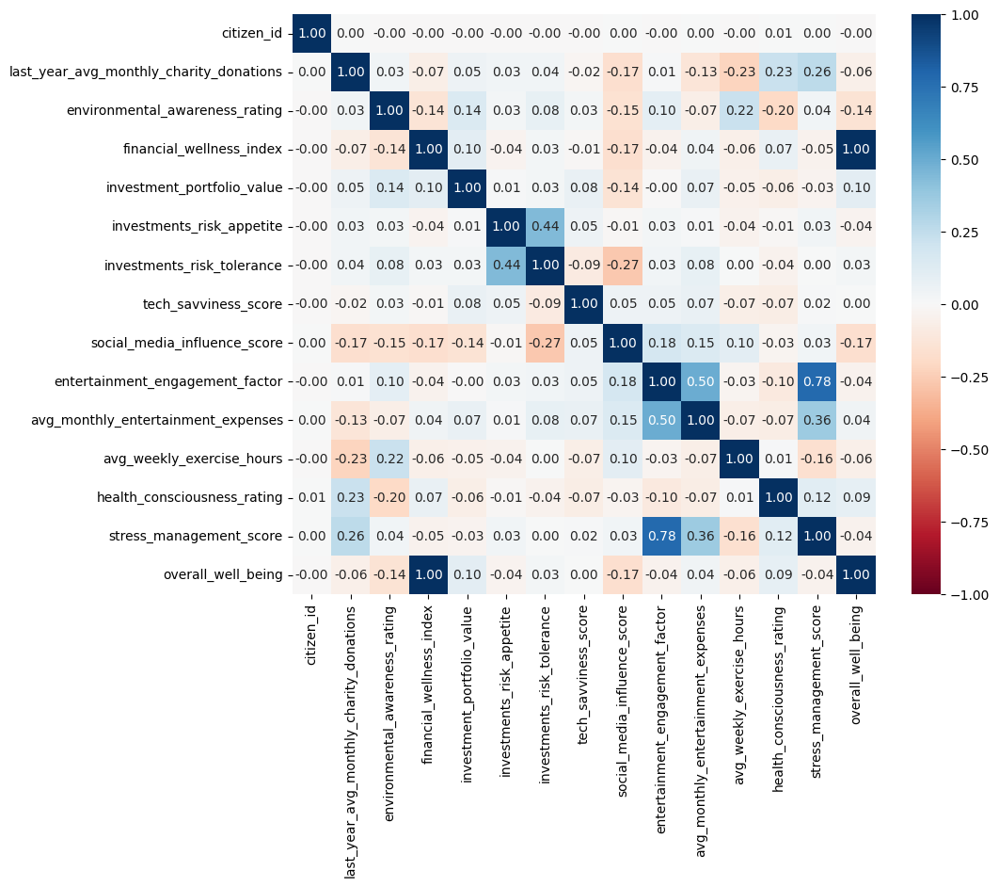

In [13]:
# Correlation Matrix Heatmap - train data
plt.figure(figsize=(10,8))
sns.heatmap(data=cor_pearson_train, annot=True, cmap = plt.cm.RdBu, fmt='.2f', vmin = -1, vmax = 1, center = 0)

In [14]:
# We will consider high correlation above 0.8
# financial_wellness will be discarded by RFE method later

### <font color=72beea> **Multivariate Analysis** </font>

<Figure size 1000x1500 with 0 Axes>

<Axes: >

<Axes: xlabel='title', ylabel='count'>

Text(0.5, 1.0, 'Count Plot for Title')

([0, 1, 2, 3],
 [Text(0, 0, 'Mr.'),
  Text(1, 0, 'Miss'),
  Text(2, 0, 'Mrs.'),
  Text(3, 0, 'Ms.')])

<Axes: >

<Axes: xlabel='city', ylabel='count'>

Text(0.5, 1.0, 'Count Plot for City')

([0], [Text(0, 0, 'Mining City')])

<Axes: >

<Axes: xlabel='country', ylabel='count'>

Text(0.5, 1.0, 'Count Plot for Country')

([0], [Text(0, 0, 'Data Land')])

<Axes: >

<Axes: xlabel='lifestyle_type', ylabel='count'>

Text(0.5, 1.0, 'Count Plot for Lifestyle_type')

([0, 1, 2, 3, 4],
 [Text(0, 0, 'Health-Conscious'),
  Text(1, 0, 'Investor'),
  Text(2, 0, 'Fitness Enthusiast'),
  Text(3, 0, 'Adventure Seeker'),
  Text(4, 0, 'Travel Enthusiast')])

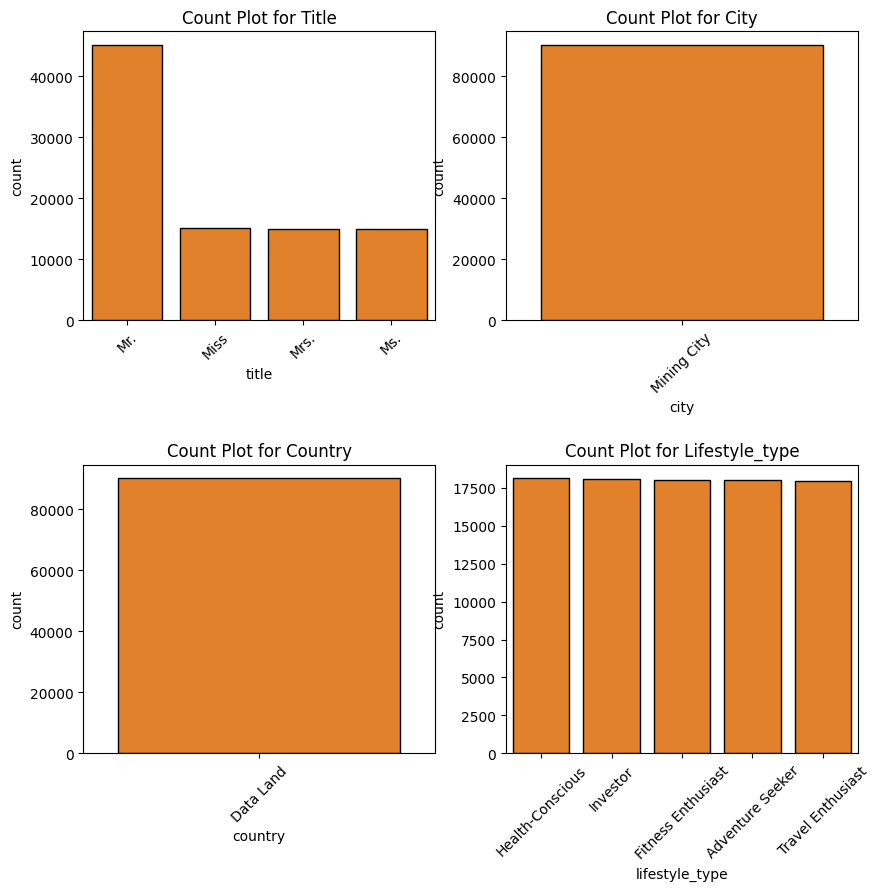

In [15]:
# Count Plots
plt.figure(figsize=(10, 15))
for i, variable in enumerate(['title', 'city', 'country', 'lifestyle_type'], 1):
    plt.subplot(3, 2, i)
    sns.countplot(x=variable, data=train_data, order=train_data[variable].value_counts().index, color='C1', edgecolor='black')
    plt.title(f'Count Plot for {variable.capitalize()}')
    plt.xticks(rotation=45)
    plt.subplots_adjust(hspace=0.5)
plt.show()

<Figure size 2000x2500 with 0 Axes>

<Axes: >

<Axes: xlabel='last_year_avg_monthly_charity_donations', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Last_year_avg_monthly_charity_donations')

Text(0.5, 0, 'Last_year_avg_monthly_charity_donations')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='environmental_awareness_rating', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Environmental_awareness_rating')

Text(0.5, 0, 'Environmental_awareness_rating')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='financial_wellness_index', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Financial_wellness_index')

Text(0.5, 0, 'Financial_wellness_index')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='investment_portfolio_value', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Investment_portfolio_value')

Text(0.5, 0, 'Investment_portfolio_value')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='investments_risk_appetite', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Investments_risk_appetite')

Text(0.5, 0, 'Investments_risk_appetite')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='investments_risk_tolerance', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Investments_risk_tolerance')

Text(0.5, 0, 'Investments_risk_tolerance')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='tech_savviness_score', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Tech_savviness_score')

Text(0.5, 0, 'Tech_savviness_score')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='social_media_influence_score', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Social_media_influence_score')

Text(0.5, 0, 'Social_media_influence_score')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='entertainment_engagement_factor', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Entertainment_engagement_factor')

Text(0.5, 0, 'Entertainment_engagement_factor')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='avg_monthly_entertainment_expenses', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Avg_monthly_entertainment_expenses')

Text(0.5, 0, 'Avg_monthly_entertainment_expenses')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='avg_weekly_exercise_hours', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Avg_weekly_exercise_hours')

Text(0.5, 0, 'Avg_weekly_exercise_hours')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='health_consciousness_rating', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Health_consciousness_rating')

Text(0.5, 0, 'Health_consciousness_rating')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='stress_management_score', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Stress_management_score')

Text(0.5, 0, 'Stress_management_score')

Text(0, 0.5, 'Frequency')

<Axes: >

<Axes: xlabel='overall_well_being', ylabel='Count'>

Text(0.5, 1.0, 'Distribution of Overall_well_being')

Text(0.5, 0, 'Overall_well_being')

Text(0, 0.5, 'Frequency')

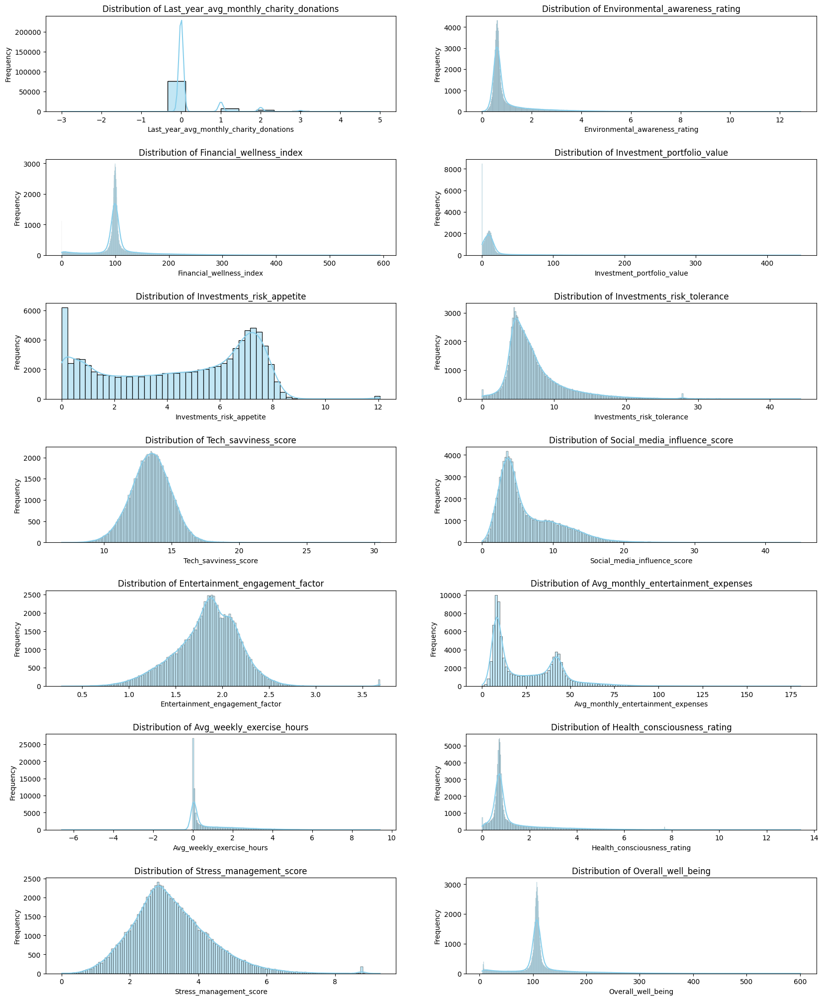

In [16]:
#Histogram
# Select only numeric columns and exclude 'citizen_id'
numeric_data = train_data.select_dtypes(include=['number']).drop(columns=['citizen_id'])

# Determine the number of numeric variables
num_vars = len(numeric_data.columns)

# Create histograms
plt.figure(figsize=(20, 25))
for i, variable in enumerate(numeric_data.columns, 1):
    plt.subplot((num_vars + 1) // 2, 2, i)  # Adjust the grid size
    sns.histplot(numeric_data[variable], kde=True, color='skyblue')
    plt.title(f'Distribution of {variable.capitalize()}')
    plt.xlabel(variable.capitalize())
    plt.ylabel('Frequency')

plt.subplots_adjust(hspace=0.5)
plt.show()

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='financial_wellness_index', ylabel='Count'>

Text(0.5, 1.0, 'financial_wellness_index Distribution')

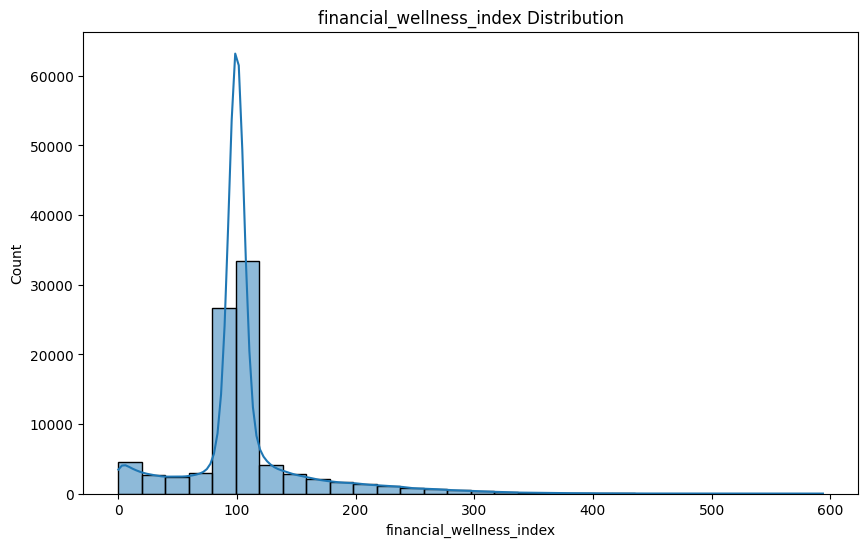

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='investment_portfolio_value', ylabel='Count'>

Text(0.5, 1.0, 'investment_portfolio_value Distribution')

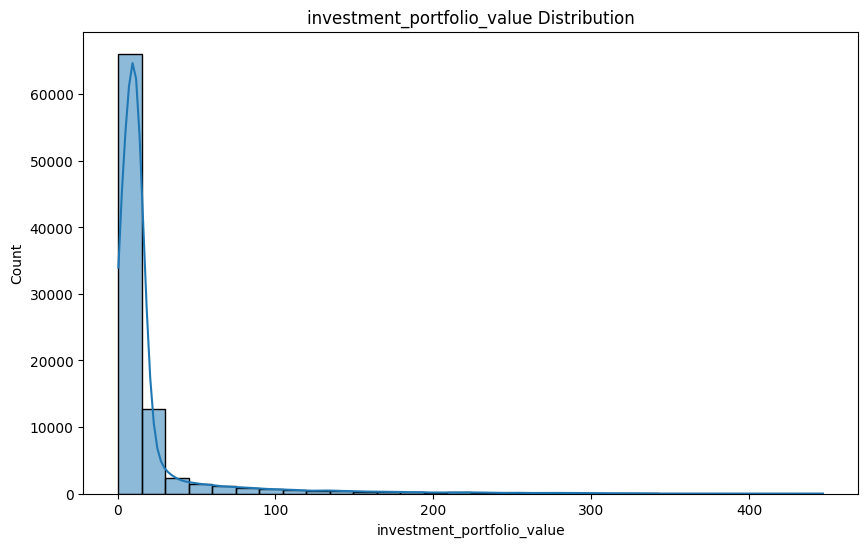

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='last_year_avg_monthly_charity_donations', ylabel='Count'>

Text(0.5, 1.0, 'last_year_avg_monthly_charity_donations Distribution')

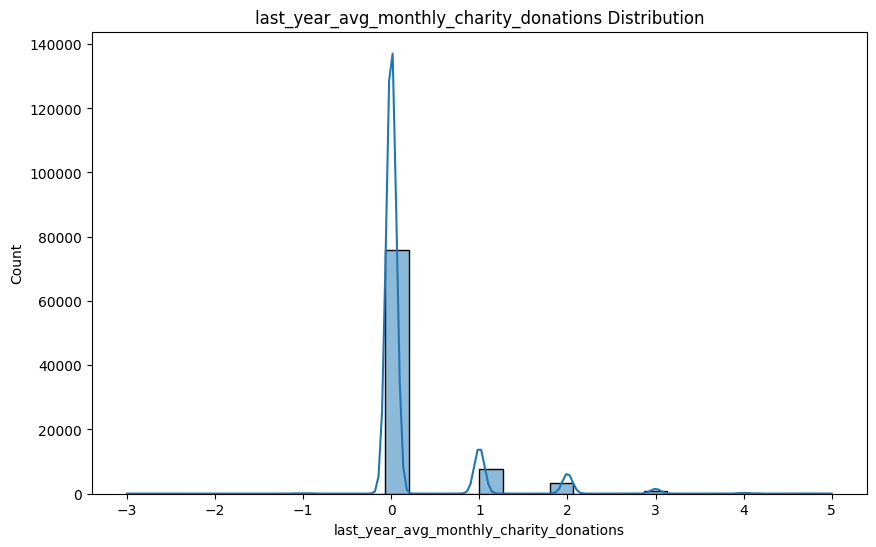

In [17]:
# Financial Attributes
financial_attributes = [
    'financial_wellness_index',
    'investment_portfolio_value',
    'last_year_avg_monthly_charity_donations'
]

# Histograms for Financial Attributes
for attribute in financial_attributes:
    plt.figure(figsize=(10, 6))
    sns.histplot(train_data[attribute], bins=30, kde=True)
    plt.title(f'{attribute} Distribution')
    plt.show()

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='avg_weekly_exercise_hours', ylabel='Count'>

Text(0.5, 1.0, 'avg_weekly_exercise_hours Distribution')

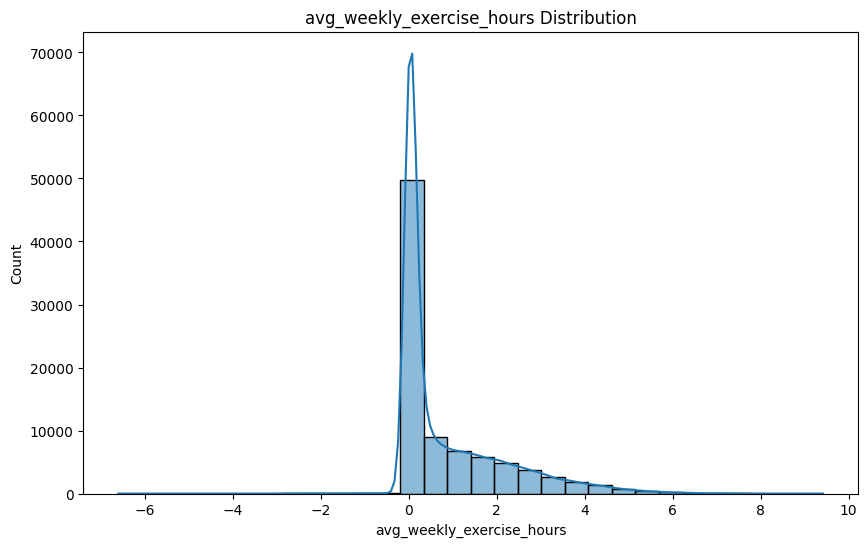

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='health_consciousness_rating', ylabel='Count'>

Text(0.5, 1.0, 'health_consciousness_rating Distribution')

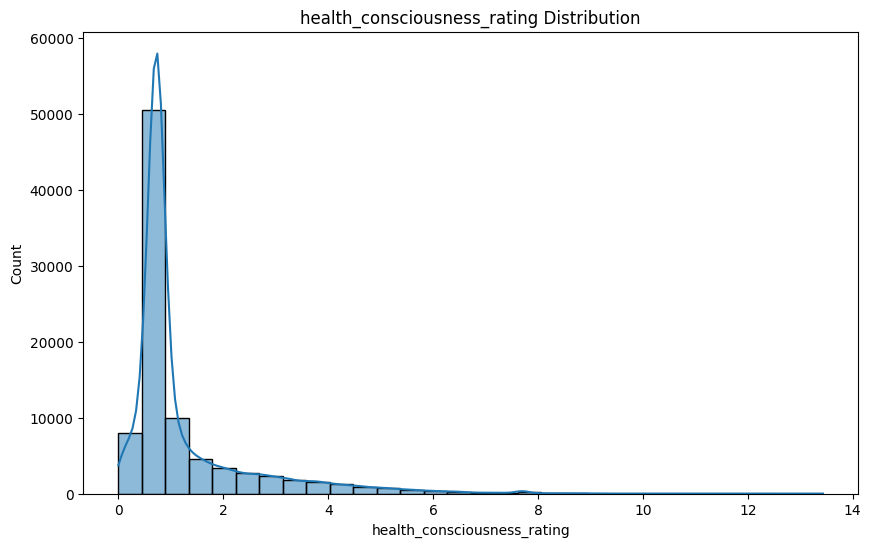

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='stress_management_score', ylabel='Count'>

Text(0.5, 1.0, 'stress_management_score Distribution')

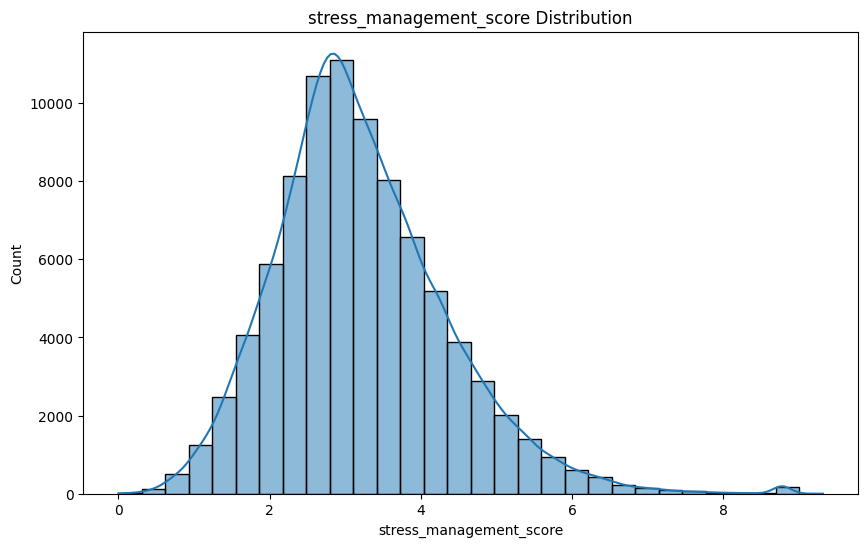

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='overall_well_being', ylabel='Count'>

Text(0.5, 1.0, 'overall_well_being Distribution')

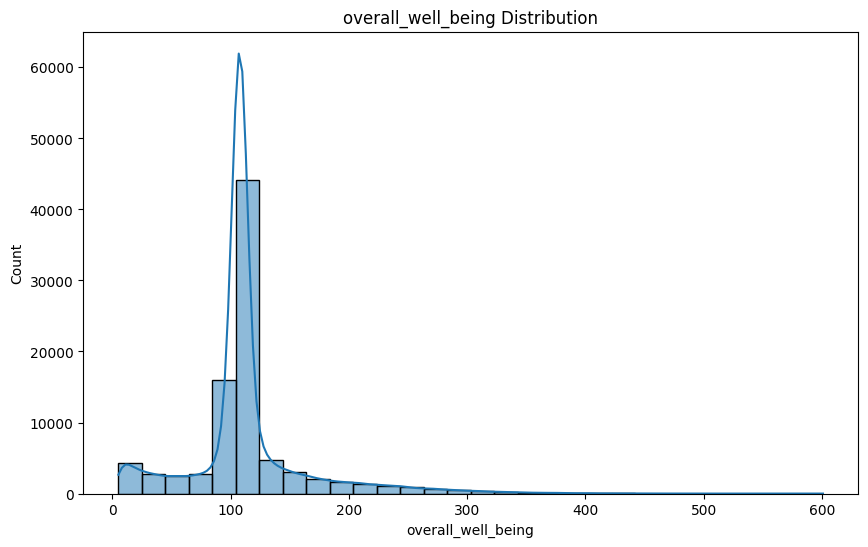

In [18]:
# Health and Wellness Attributes
health_attributes = [
    'avg_weekly_exercise_hours',
    'health_consciousness_rating',
    'stress_management_score',
    'overall_well_being'
]

# Histograms for Health and Wellness Attributes
for attribute in health_attributes:
    plt.figure(figsize=(10, 6))
    sns.histplot(train_data[attribute], bins=30, kde=True)
    plt.title(f'{attribute} Distribution')
    plt.show()

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='avg_monthly_entertainment_expenses', ylabel='entertainment_engagement_factor'>

Text(0.5, 1.0, 'Scatter Plot of avg_monthly_entertainment_expenses vs entertainment_engagement_factor')

Text(0.5, 0, 'avg_monthly_entertainment_expenses')

Text(0, 0.5, 'entertainment_engagement_factor')

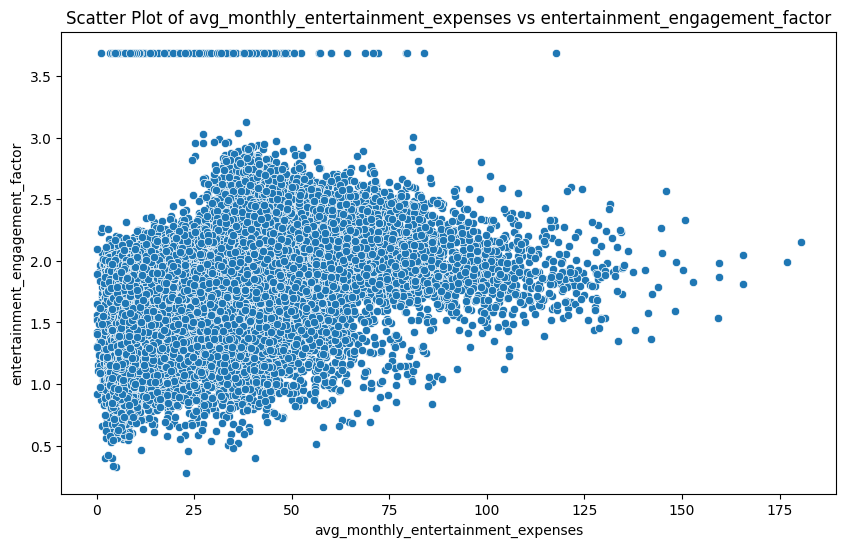

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='avg_monthly_entertainment_expenses', ylabel='avg_weekly_exercise_hours'>

Text(0.5, 1.0, 'Scatter Plot of avg_monthly_entertainment_expenses vs avg_weekly_exercise_hours')

Text(0.5, 0, 'avg_monthly_entertainment_expenses')

Text(0, 0.5, 'avg_weekly_exercise_hours')

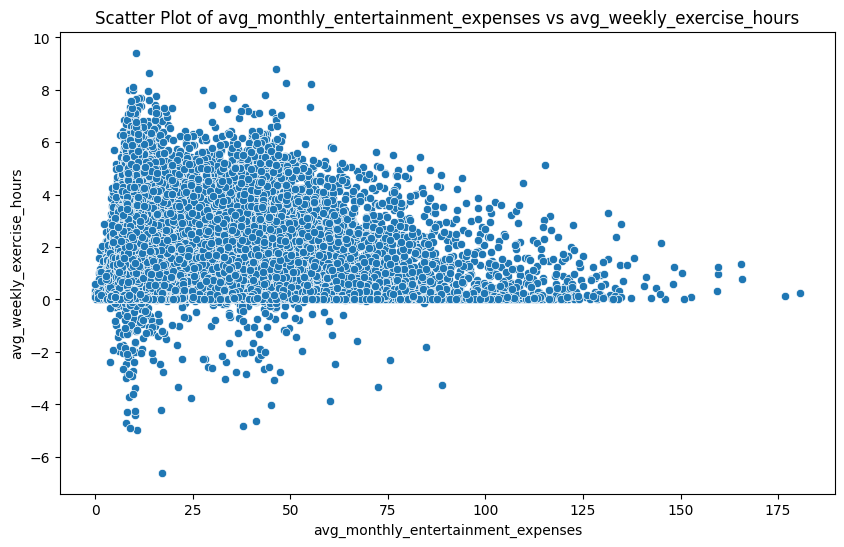

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='entertainment_engagement_factor', ylabel='avg_weekly_exercise_hours'>

Text(0.5, 1.0, 'Scatter Plot of entertainment_engagement_factor vs avg_weekly_exercise_hours')

Text(0.5, 0, 'entertainment_engagement_factor')

Text(0, 0.5, 'avg_weekly_exercise_hours')

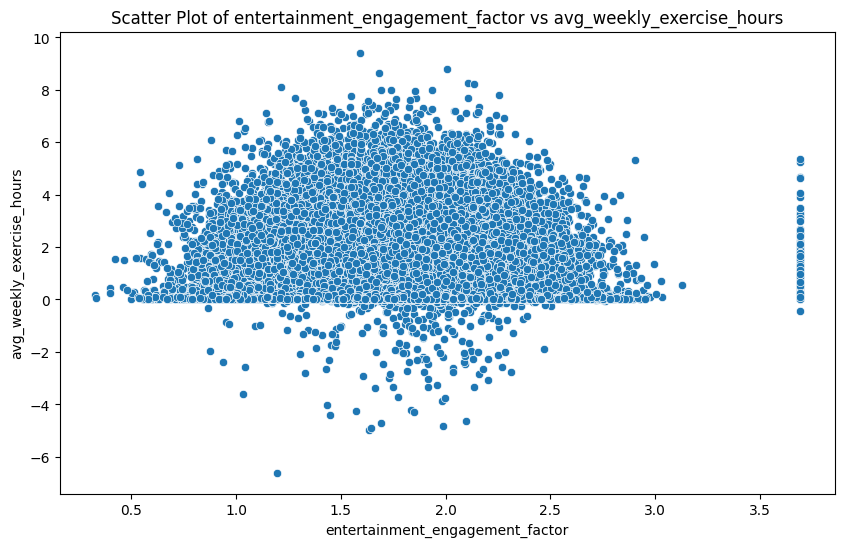

In [19]:
#Entertainment and Lifestyle Attributes
entertainment_pairs = [
    ('avg_monthly_entertainment_expenses', 'entertainment_engagement_factor'),
    ('avg_monthly_entertainment_expenses', 'avg_weekly_exercise_hours'),
    ('entertainment_engagement_factor', 'avg_weekly_exercise_hours')
]

for x_attr, y_attr in entertainment_pairs:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=train_data[x_attr], y=train_data[y_attr])
    plt.title(f'Scatter Plot of {x_attr} vs {y_attr}')
    plt.xlabel(x_attr)
    plt.ylabel(y_attr)
    plt.show()

## <font color=72beea> **2. Data Preparation** </font>

## <font color=72beea> **2.1. Duplicate Values** </font>

In [20]:
pd.set_option('display.max_columns', None)

In [21]:
# Presents all the duplicate values - train data
train_data[train_data.duplicated(subset=train_data.columns.difference(['citizen_id']), keep=False)]

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type
428,429,Sumana,Ms.,1980-03-14,Mining City,Data Land,0.0,1.4578,95.8334,97.8785,2.3739,6.5015,10.2318,2.7034,1.7770,9.2695,1.0510,0.9489,2.4986,101.898,Adventure Seeker
437,438,Sumana,Ms.,1980-03-14,Mining City,Data Land,0.0,1.4578,95.8334,97.8785,2.3739,6.5015,10.2318,2.7034,1.7770,9.2695,1.0510,0.9489,2.4986,101.898,Adventure Seeker
539,540,Victoria,Ms.,1973-11-03,Mining City,Data Land,2.0,6.3031,18.5283,4.6317,4.8384,7.1589,13.5363,3.7076,1.7902,7.3321,0.0000,0.7845,2.4979,26.081,Investor
548,549,Victoria,Ms.,1973-11-03,Mining City,Data Land,2.0,6.3031,18.5283,4.6317,4.8384,7.1589,13.5363,3.7076,1.7902,7.3321,0.0000,0.7845,2.4979,26.081,Investor
640,641,Tracey,Mrs.,1978-01-20,Mining City,Data Land,0.0,4.2326,101.5230,11.4343,1.4000,4.5370,15.1917,4.1115,1.9243,13.1715,1.2219,0.8277,2.8629,109.946,Adventure Seeker
659,660,Tracey,Mrs.,1978-01-20,Mining City,Data Land,0.0,4.2326,101.5230,11.4343,1.4000,4.5370,15.1917,4.1115,1.9243,13.1715,1.2219,0.8277,2.8629,109.946,Adventure Seeker
751,752,Ademar,Mr.,2005-06-21,Mining City,Data Land,1.0,0.8168,210.8890,11.5203,7.9459,10.2605,15.1572,4.4048,2.1534,40.9407,0.0000,1.2484,3.7019,219.716,Health-Conscious
760,761,Ademar,Mr.,2005-06-21,Mining City,Data Land,1.0,0.8168,210.8890,11.5203,7.9459,10.2605,15.1572,4.4048,2.1534,40.9407,0.0000,1.2484,3.7019,219.716,Health-Conscious
862,863,Noah,Mr.,1994-05-28,Mining City,Data Land,0.0,0.4649,97.7775,7.4042,6.0479,0.4323,12.8471,5.1393,0.8429,28.1339,0.0000,0.6700,0.6960,104.871,Travel Enthusiast
871,872,Noah,Mr.,1994-05-28,Mining City,Data Land,0.0,0.4649,97.7775,7.4042,6.0479,0.4323,12.8471,5.1393,0.8429,28.1339,0.0000,0.6700,0.6960,104.871,Travel Enthusiast


In [22]:
# Presents all the duplicate values - test data
test_data[test_data.duplicated(subset=test_data.columns.difference(['citizen_id']), keep=False)]

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being


In [23]:
# Drop duplicates - train data
train_data = train_data.drop_duplicates(subset=train_data.columns.difference(['citizen_id']))
# Confirm that all duplicate values were deleted
train_data[train_data.duplicated(subset=train_data.columns.difference(['citizen_id']), keep=False)]

,citizen_id,name,title,date_of_birth,city,country,last_year_avg_monthly_charity_donations,environmental_awareness_rating,financial_wellness_index,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type


## <font color=72beea> **2.2. Incoherencies, Outliers and Missing Values** </font>

In [24]:
# Return a table with the number of missing values for each variable and the respective percentage

def missing_values_table(data):
    no_mis_val_rows = data.dropna()
    mis_val = data.isnull().sum()
    mis_val_percent = 100 * data.isnull().sum() / len(data)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
            columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
    print ("Your dataframe has " + str(data.shape[1]) + " columns.\n"
           "There are " + str(mis_val_table_ren_columns.shape[0]) + " columns that have missing values.\n"
           "Your dataframe has " + str(data.shape[0]) + " rows.\n"
           "There are " + str(data.shape[0] - no_mis_val_rows.shape[0]) + " rows that have missing values.\n")
    return mis_val_table_ren_columns

In [25]:
missing_values_table(train_data)

Your dataframe has 21 columns.
There are 14 columns that have missing values.
Your dataframe has 90160 rows.
There are 25328 rows that have missing values.



,Missing Values,% of Total Values
environmental_awareness_rating,3607,4.0
stress_management_score,3607,4.0
investments_risk_tolerance,3156,3.5
tech_savviness_score,3156,3.5
avg_weekly_exercise_hours,2704,3.0
last_year_avg_monthly_charity_donations,2254,2.5
social_media_influence_score,2254,2.5
investment_portfolio_value,1803,2.0
financial_wellness_index,1802,2.0
investments_risk_appetite,1352,1.5


In [26]:
missing_values_table(test_data)

Your dataframe has 20 columns.
There are 14 columns that have missing values.
Your dataframe has 38643 rows.
There are 12232 rows that have missing values.



,Missing Values,% of Total Values
avg_weekly_exercise_hours,1546,4.0
stress_management_score,1546,4.0
last_year_avg_monthly_charity_donations,1353,3.5
social_media_influence_score,1353,3.5
entertainment_engagement_factor,1353,3.5
investment_portfolio_value,1159,3.0
environmental_awareness_rating,966,2.5
financial_wellness_index,966,2.5
tech_savviness_score,966,2.5
health_consciousness_rating,966,2.5


## <font color=72beea> **name** </font>

#### **train data**

In [27]:
# drop name variable
train_data.drop(['name'], axis=1, inplace=True)

#### **test data**

In [28]:
# drop name variable
test_data.drop(['name'], axis=1, inplace=True)

## <font color=72beea> **title** </font>

#### **train data**

In [29]:
train_data['title'].value_counts()

title
Mr.     45124
Miss    15105
Mrs.    14990
Ms.     14941
Name: count, dtype: int64

In [30]:
title_to_gender = {
    "Mr.": "Male",
    "Miss": "Female",
    "Mrs.": "Female",
    "Ms.": "Female"
}

# Create the 'gender' column using map
train_data['gender'] = train_data['title'].map(title_to_gender)
train_data['gender'].value_counts()

gender
Male      45124
Female    45036
Name: count, dtype: int64

In [31]:
# encode gender variable - 1 male; 0 female
encoder = LabelEncoder()

train_data['gender_encoded'] = encoder.fit_transform(train_data['gender'])
train_data['gender_encoded'].value_counts()

gender_encoded
1    45124
0    45036
Name: count, dtype: int64

In [32]:
train_data.drop(['gender'], axis=1, inplace=True)

In [33]:
train_data.drop(['title'], axis=1, inplace=True)

#### **test data**

In [34]:
test_data['title'].value_counts()

title
Mr.     19429
Ms.      6546
Miss     6421
Mrs.     6247
Name: count, dtype: int64

In [35]:
title_to_gender = {
    "Mr.": "Male",
    "Miss": "Female",
    "Mrs.": "Female",
    "Ms.": "Female"
}

# Create the 'gender' column using map
test_data['gender'] = test_data['title'].map(title_to_gender)
test_data['gender'].value_counts()

gender
Male      19429
Female    19214
Name: count, dtype: int64

In [36]:
# encode gender variable - 1 male; 0 female
encoder = LabelEncoder()
test_data['gender_encoded'] = encoder.fit_transform(test_data['gender'])
test_data['gender_encoded'].value_counts()

gender_encoded
1    19429
0    19214
Name: count, dtype: int64

In [37]:
test_data.drop(['gender'], axis=1, inplace=True)

In [38]:
test_data.drop(['title'], axis=1, inplace=True)

## <font color=72beea> **date_of_birth** </font>

#### **train data**

In [39]:
train_data['date_of_birth'].value_counts().sort_index()

date_of_birth
1900-01-11    1
1900-01-18    1
1900-02-03    2
1900-02-05    1
1900-02-07    1
             ..
2023-08-16    4
2023-08-17    4
2023-08-18    9
2023-08-19    5
2023-08-20    4
Name: count, Length: 16878, dtype: int64

In [40]:
# isolate the year
train_data['year_birth'] = pd.DatetimeIndex(train_data['date_of_birth']).year

In [41]:
train_data['year_birth'].value_counts().sort_index() # 50 of 1900; 154 of 2023

year_birth
1900      50
1942       6
1943      11
1944      18
1945      20
        ... 
2002    2356
2003    2295
2004    2282
2005    1144
2023     154
Name: count, Length: 66, dtype: int64

In [42]:
px.box(train_data, y="year_birth")

In [43]:
# Replace 1900 by mean
train_data['year_birth'].replace(1900, (train_data['year_birth'].mean()).round(), inplace = True)

In [44]:
# Replace 2023 by 2005
train_data.loc[train_data['year_birth']==2023,'year_birth'] = 2005

In [45]:
train_data['year_birth'].value_counts().sort_index()

year_birth
1942       6
1943      11
1944      18
1945      20
1946      21
        ... 
2001    2593
2002    2356
2003    2295
2004    2282
2005    1298
Name: count, Length: 64, dtype: int64

In [46]:
# age variable function
def age(year):
  today = date.today()
  return today.year - year

In [47]:
# create age variable
train_data['age'] = train_data['year_birth'].apply(age)

In [48]:
train_data['age'].value_counts().sort_index()

age
19    1298
20    2282
21    2295
22    2356
23    2593
      ... 
78      21
79      20
80      18
81      11
82       6
Name: count, Length: 64, dtype: int64

In [49]:
px.histogram(train_data, x="age")

In [50]:
train_data.drop(['date_of_birth'], axis=1, inplace=True)

In [51]:
train_data.drop(['year_birth'], axis=1, inplace=True)

#### **test data**

In [52]:
test_data['date_of_birth'].value_counts().sort_index()

date_of_birth
1923-11-05    1
1932-11-18    1
1933-06-27    1
1935-05-07    1
1935-08-19    1
             ..
2005-08-16    2
2005-08-17    1
2005-08-18    3
2005-08-19    3
2005-08-20    7
Name: count, Length: 14108, dtype: int64

In [53]:
#only the year
test_data['year_birth'] = pd.DatetimeIndex(test_data['date_of_birth']).year

test_data['year_birth'].value_counts().sort_index()

year_birth
1923       1
1932       1
1933       1
1935       2
1938       1
        ... 
2001    1074
2002    1057
2003     984
2004     909
2005     571
Name: count, Length: 72, dtype: int64

In [54]:
#px.histogram(test_data, x="age")

In [55]:
# create age variable
test_data['age'] = test_data['year_birth'].apply(age)

In [56]:
test_data['age'].value_counts().sort_index()

age
19      571
20      909
21      984
22     1057
23     1074
       ... 
86        1
89        2
91        1
92        1
101       1
Name: count, Length: 72, dtype: int64

In [57]:
test_data.drop(['date_of_birth'], axis=1, inplace=True)

In [58]:
test_data.drop(['year_birth'], axis=1, inplace=True)

## <font color=72beea> **city** </font>

#### **train data**

In [59]:
train_data['city'].value_counts() #all values are identical, meaning this variable is not relevant

city
Mining City    90160
Name: count, dtype: int64

In [60]:
train_data.drop('city', axis=1, inplace=True)

#### **test data**

In [61]:
test_data['city'].value_counts() #all values are identical, meaning this variable is not relevant

city
Mining City    38643
Name: count, dtype: int64

In [62]:
test_data.drop('city', axis=1, inplace=True)

## <font color=72beea> **country** </font>

#### **train data**

In [63]:
train_data['country'].value_counts() #all values are identical, meaning this variable is not relevant

country
Data Land    90160
Name: count, dtype: int64

In [64]:
train_data.drop('country', axis=1, inplace=True)

#### **test data**

In [65]:
test_data['country'].value_counts() #all values are identical, meaning this variable is not relevant

country
Data Land    38643
Name: count, dtype: int64

In [66]:
test_data.drop('country', axis=1, inplace=True)

## <font color=72beea> **last_year_avg_monthly_charity_donations** </font>

#### **train data**

In [67]:
train_data['last_year_avg_monthly_charity_donations'].value_counts()

last_year_avg_monthly_charity_donations
 0.0    75847
 1.0     7761
 2.0     3349
 3.0      792
 4.0      105
-1.0       26
 5.0       12
-2.0        9
-3.0        5
Name: count, dtype: int64

In [68]:
# Convert Negative Values Into Absolute Value
train_data['last_year_avg_monthly_charity_donations'] = train_data['last_year_avg_monthly_charity_donations'].abs()
train_data['last_year_avg_monthly_charity_donations'].value_counts()

last_year_avg_monthly_charity_donations
0.0    75847
1.0     7787
2.0     3358
3.0      797
4.0      105
5.0       12
Name: count, dtype: int64

In [69]:
# Plot boxplot
px.box(train_data, y="last_year_avg_monthly_charity_donations")

<Figure size 1000x600 with 0 Axes>

(array([7.5847e+04, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 7.7870e+03, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 3.3580e+03, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 7.9700e+02, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0500e+02,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.2000e+01]),
 array([0.        , 0.16666667, 0.33333333, 0.5       , 0.66666667,
        0.83333333, 1.        , 1.16666667, 1.33333333, 1.5       ,
        1.66666667, 1.83333333, 2.        , 2.16666667, 2.33333333,
        2.5       , 2.66666667, 2.83333333, 3.        , 3.16666667,
        3.33333333, 3.5       , 3.66666667, 3.83333333, 4.        ,
        4.16666667, 4.33333333, 4.5       , 4.66666667, 4.83333333,
        5.        ]),
 <BarContainer object of 30 artists>)

Text(0.5, 1.0, 'Histogram of Last Year Avg Monthly Charity Donation')

Text(0.5, 0, 'Last Year Avg Monthly Charity Donation')

Text(0, 0.5, 'Frequency')

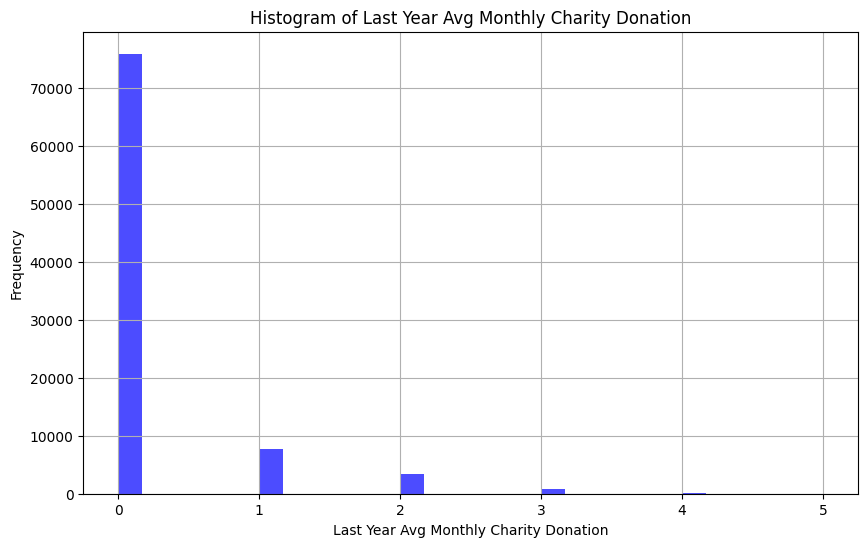

In [70]:
# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(train_data['last_year_avg_monthly_charity_donations'].dropna(), bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Last Year Avg Monthly Charity Donation')
plt.xlabel('Last Year Avg Monthly Charity Donation')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [71]:
imputer = KNNImputer(n_neighbors = math.ceil(math.sqrt(90165)))

train_data[['last_year_avg_monthly_charity_donations']] = np.round(imputer.fit_transform(train_data[['last_year_avg_monthly_charity_donations']]))

In [72]:
# See if there are still missing values
missing_values_count = train_data['last_year_avg_monthly_charity_donations'].isnull().sum()
print(missing_values_count)

0


#### **test data**

In [73]:
test_data['last_year_avg_monthly_charity_donations'].value_counts()

last_year_avg_monthly_charity_donations
 0.0    32183
 1.0     3302
 2.0     1412
 3.0      335
 4.0       48
 5.0        5
-2.0        3
-1.0        1
-3.0        1
Name: count, dtype: int64

In [74]:
# Convert Negative Values Into Absolute Value
test_data['last_year_avg_monthly_charity_donations'] = test_data['last_year_avg_monthly_charity_donations'].abs()
test_data['last_year_avg_monthly_charity_donations'].value_counts()

last_year_avg_monthly_charity_donations
0.0    32183
1.0     3303
2.0     1415
3.0      336
4.0       48
5.0        5
Name: count, dtype: int64

In [75]:
# Impute missing values using same instance of imputer fit to training data
test_data[['last_year_avg_monthly_charity_donations']] = np.round(imputer.transform(test_data[['last_year_avg_monthly_charity_donations']]))

## <font color=72beea> **environmental_awareness_rating** </font>

#### **train data**

In [76]:
train_data['environmental_awareness_rating'].value_counts().sort_index()

environmental_awareness_rating
0.0000     4
0.0215     1
0.0225     1
0.0275     1
0.0327     1
          ..
10.2164    1
10.2180    1
10.2418    1
10.7168    1
12.8360    1
Name: count, Length: 21965, dtype: int64

In [77]:
# Convert Values Higher than 10 to 10
train_data.loc[train_data['environmental_awareness_rating'] > 10, 'environmental_awareness_rating'] = 10
train_data['environmental_awareness_rating'].value_counts().sort_index()

environmental_awareness_rating
0.0000     4
0.0215     1
0.0225     1
0.0275     1
0.0327     1
          ..
9.3697     1
9.4070     1
9.4582     1
9.4653     1
10.0000    5
Name: count, Length: 21961, dtype: int64

In [78]:
# Plot Box Plot
px.box(train_data, y="environmental_awareness_rating")

In [79]:
# Plot Scatter Plot
px.scatter(train_data, y="environmental_awareness_rating")

In [80]:
# Convert Outliers to Nan
train_data.loc[train_data['environmental_awareness_rating'] > 8, 'environmental_awareness_rating'] = np.nan

In [81]:
imputer = KNNImputer(n_neighbors = math.ceil(math.sqrt(90165) / 2))

train_data[['environmental_awareness_rating']] = imputer.fit_transform(train_data[['environmental_awareness_rating']])

In [82]:
# See if there are still missing values
missing_values_count = train_data['environmental_awareness_rating'].isnull().sum()
print(missing_values_count)

0


In [83]:
# create log variable
train_data['log_environmental_awareness_rating'] = np.log(train_data['environmental_awareness_rating']+1)

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_environmental_awareness_rating', ylabel='Count'>

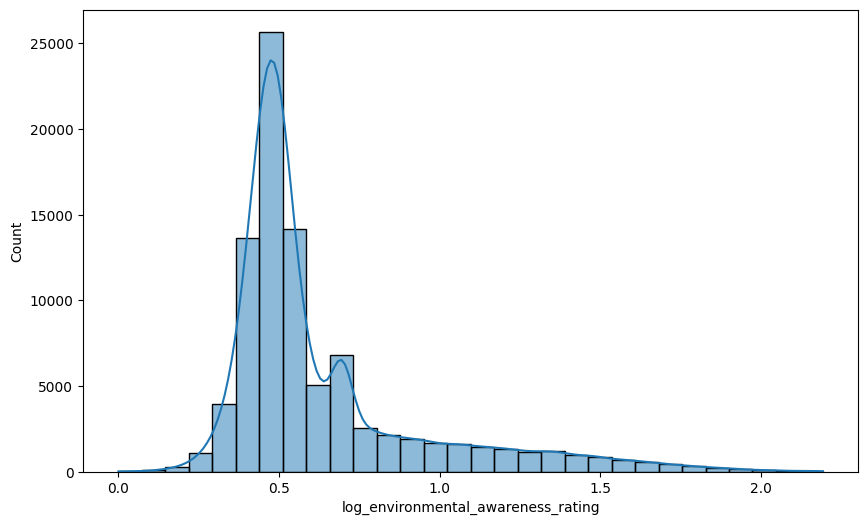

In [84]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_environmental_awareness_rating'], bins=30, kde=True)
plt.show()

#### **test data**

In [85]:
test_data['environmental_awareness_rating'].value_counts()

environmental_awareness_rating
0.6462    24
0.5612    20
0.6318    19
0.5716    19
0.6350    18
          ..
1.5974     1
1.1693     1
1.2667     1
2.7128     1
1.1190     1
Name: count, Length: 14027, dtype: int64

In [86]:
test_data.loc[test_data['environmental_awareness_rating'] > 10, 'environmental_awareness_rating'] = 10

In [87]:
train_data.loc[train_data['environmental_awareness_rating'] > 8, 'environmental_awareness_rating'] = np.nan

In [88]:
# Impute missing values
test_data[['environmental_awareness_rating']] = imputer.transform(test_data[['environmental_awareness_rating']])

In [89]:
# create log variable
test_data['log_environmental_awareness_rating'] = np.log(test_data['environmental_awareness_rating']+1)

## <font color=72beea> **financial_wellness_index** </font>

#### **train data**

In [90]:
train_data.drop('financial_wellness_index', axis=1, inplace=True)

#### **test data**

In [91]:
test_data.drop('financial_wellness_index', axis=1, inplace=True)

## <font color=72beea> **investment_portfolio_value** </font>

#### **train data**

In [92]:
train_data['investment_portfolio_value'].value_counts().sort_index()

investment_portfolio_value
0.5000      7581
0.5020         1
0.5029         1
0.5035         1
0.5040         1
            ... 
433.1680       1
437.6760       1
437.9410       1
443.0260       1
446.8660       1
Name: count, Length: 69102, dtype: int64

In [93]:
px.scatter(train_data, y="investment_portfolio_value")

In [94]:
px.box(train_data, y="investment_portfolio_value")

In [95]:
#Turn outliers (values above 250) to NaN
train_data.loc[train_data['investment_portfolio_value'] > 250, 'investment_portfolio_value'] = np.nan
median_investment_portfolio_value = train_data['investment_portfolio_value'].median()
train_data['investment_portfolio_value'].fillna(median_investment_portfolio_value, inplace=True)

In [96]:
median_value = train_data['investment_portfolio_value'].median()
print(f"Median for investment_portfolio_value: {median_value}")
mean_value = train_data['investment_portfolio_value'].mean()
print(f"Mean for investment_portfolio_value: {mean_value}")

Median for investment_portfolio_value: 4.611
Mean for investment_portfolio_value: 4.518101072537711


In [97]:
# We will impute the missing values with the median
imputer = SimpleImputer(strategy='median')
train_data['investment_portfolio_value'] = imputer.fit_transform(train_data[['investment_portfolio_value']])

In [98]:
# Calculate the number of missing values
missing_values_count = train_data['investment_portfolio_value'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(train_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in investment_portfolio_value: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in investment_portfolio_value: 0 (0.00%)


In [99]:
total_records = train_data['investment_portfolio_value'].value_counts()
print(f"Total number of records for investment_portfolio_value: {total_records}")

Total number of records for investment_portfolio_value: investment_portfolio_value
4.6110    53696
0.5000     7581
8.0719        5
8.8803        5
5.4989        5
          ...  
2.3108        1
6.1007        1
8.5764        1
8.5558        1
3.3271        1
Name: count, Length: 24217, dtype: int64


In [100]:
train_data['log_investment_portfolio_value'] = np.log(train_data['investment_portfolio_value'])

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_investment_portfolio_value', ylabel='Count'>

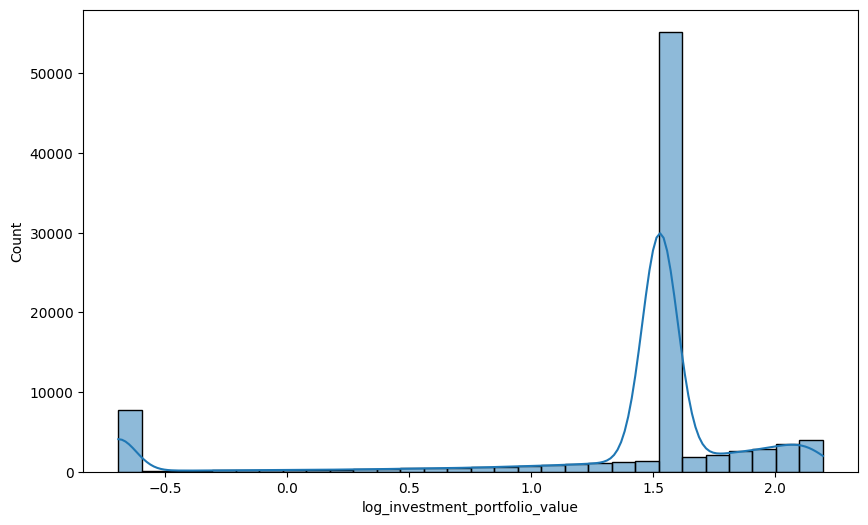

In [101]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_investment_portfolio_value'], bins=30, kde=True)
plt.show()

#### **test data**

In [102]:
test_data['investment_portfolio_value'].value_counts()

investment_portfolio_value
0.5000      3197
12.3169        4
9.7000         4
8.8597         4
9.1719         4
            ... 
11.7906        1
10.6475        1
19.4683        1
146.5630       1
8.1061         1
Name: count, Length: 31976, dtype: int64

In [103]:
#Turn outliers to NaN
test_data.loc[test_data['investment_portfolio_value'] > 250, 'investment_portfolio_value'] = np.nan

test_data['investment_portfolio_value'].fillna(median_investment_portfolio_value, inplace=True)

In [104]:
# We will impute the missing values with the median
test_data['investment_portfolio_value'] = imputer.transform(test_data[['investment_portfolio_value']])

In [105]:
test_data['log_investment_portfolio_value'] = np.log(test_data['investment_portfolio_value'])

## <font color=72beea> **investments_risk_appetite** </font>

#### **train data**

In [106]:
train_data['investments_risk_appetite'].value_counts().sort_index()

investments_risk_appetite
0.0000     4044
0.0001        1
0.0002        1
0.0003        1
0.0004        1
           ... 
8.8264        1
8.8285        1
8.8445        1
8.9046        1
12.0727     176
Name: count, Length: 51056, dtype: int64

In [107]:
px.scatter(train_data, y="investments_risk_appetite")

In [108]:
px.box(train_data, y='investments_risk_appetite')

In [109]:
#Turn outliers (values above 9) as NaN
train_data.loc[train_data['investments_risk_appetite'] > 9, 'investments_risk_appetite'] = np.nan
median_investments_risk_appetite = train_data['investments_risk_appetite'].median()
train_data['investments_risk_appetite'].fillna(median_investments_risk_appetite, inplace=True)

In [110]:
median_value = train_data['investments_risk_appetite'].median()
print(f"Median for investments_risk_appetite: {median_value}")
mean_value = train_data['investments_risk_appetite'].mean()
print(f"Mean for investments_risk_appetite: {mean_value}")

Median for investments_risk_appetite: 4.92975
Mean for investments_risk_appetite: 4.436526765749779


In [111]:
# We will impute the missing values with the median
imputer = SimpleImputer(strategy='median')
train_data['investments_risk_appetite'] = imputer.fit_transform(train_data[['investments_risk_appetite']])

In [112]:
# Calculate the number of missing values
missing_values_count = train_data['investments_risk_appetite'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(train_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in investments_risk_appetite: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in investments_risk_appetite: 0 (0.00%)


In [113]:
total_records = train_data['investments_risk_appetite'].value_counts()
print(f"Total number of records for investments_risk_appetite: {total_records}")

Total number of records for investments_risk_appetite: investments_risk_appetite
0.00000    4044
4.92975    1528
7.21510       9
7.63530       8
7.54970       8
           ... 
6.55940       1
1.46720       1
3.08940       1
1.48040       1
6.32670       1
Name: count, Length: 51056, dtype: int64


#### **test data**

In [114]:
test_data['investments_risk_appetite'].value_counts().sort_index()

investments_risk_appetite
0.0000     1722
0.0001        1
0.0002        1
0.0005        1
0.0007        1
           ... 
8.8098        1
8.8586        1
8.8745        1
9.0232        1
11.3183     191
Name: count, Length: 28617, dtype: int64

In [115]:
#Turn outliers (values above 9) to NaN
test_data.loc[test_data['investments_risk_appetite'] > 9, 'investments_risk_appetite'] = np.nan

test_data['investments_risk_appetite'].fillna(median_investments_risk_appetite, inplace=True)

In [116]:
# We will impute the missing values with the median of the train data
test_data['investments_risk_appetite'] = imputer.transform(test_data[['investments_risk_appetite']])

In [117]:
# Calculate the number of missing values
missing_values_count = test_data['investments_risk_appetite'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(test_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in investments_risk_appetite: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in investments_risk_appetite: 0 (0.00%)


## <font color=72beea> **investments_risk_tolerance** </font>

#### **train data**

In [118]:
train_data['investments_risk_tolerance'].value_counts().sort_index()

investments_risk_tolerance
0.0000     244
0.0001       1
0.0002       1
0.0018       1
0.0058       1
          ... 
37.9868      1
38.1620      1
41.9740      1
42.5175      1
44.2562      1
Name: count, Length: 57416, dtype: int64

In [119]:
px.scatter(train_data, y="investments_risk_tolerance")

In [120]:
px.box(train_data, y='investments_risk_tolerance')

In [121]:
#Turn outliers (values above 25) as NaN
train_data.loc[train_data['investments_risk_tolerance'] > 25, 'investments_risk_tolerance'] = np.nan
median_investments_risk_tolerance = train_data['investments_risk_tolerance'].median()
train_data['investments_risk_tolerance'].fillna(median_investments_risk_tolerance, inplace=True)

In [122]:
median_value = train_data['investments_risk_tolerance'].median()
print(f"Median for investments_risk_tolerance: {median_value}")
mean_value = train_data['investments_risk_tolerance'].mean()
print(f"Mean for investments_risk_tolerance: {mean_value}")

Median for investments_risk_tolerance: 6.06605
Mean for investments_risk_tolerance: 7.021615559006212


In [123]:
# We will impute the missing values with the median
imputer = SimpleImputer(strategy='median')
train_data['investments_risk_tolerance'] = imputer.fit_transform(train_data[['investments_risk_tolerance']])

In [124]:
# Calculate the number of missing values
missing_values_count = train_data['investments_risk_tolerance'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(train_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in investments_risk_tolerance: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in investments_risk_tolerance: 0 (0.00%)


In [125]:
total_records = train_data['investments_risk_tolerance'].value_counts()
print(f"Total number of records for investments_risk_tolerance: {total_records}")

Total number of records for investments_risk_tolerance: investments_risk_tolerance
6.06605     3534
0.00000      244
4.43450       10
5.11340        8
5.20070        8
            ... 
18.29310       1
2.41550        1
19.68820       1
5.94390        1
4.60340        1
Name: count, Length: 57214, dtype: int64


In [126]:
# create log variable
train_data['log_investments_risk_tolerance'] = np.log(train_data['investments_risk_tolerance']+1)

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_investments_risk_tolerance', ylabel='Count'>

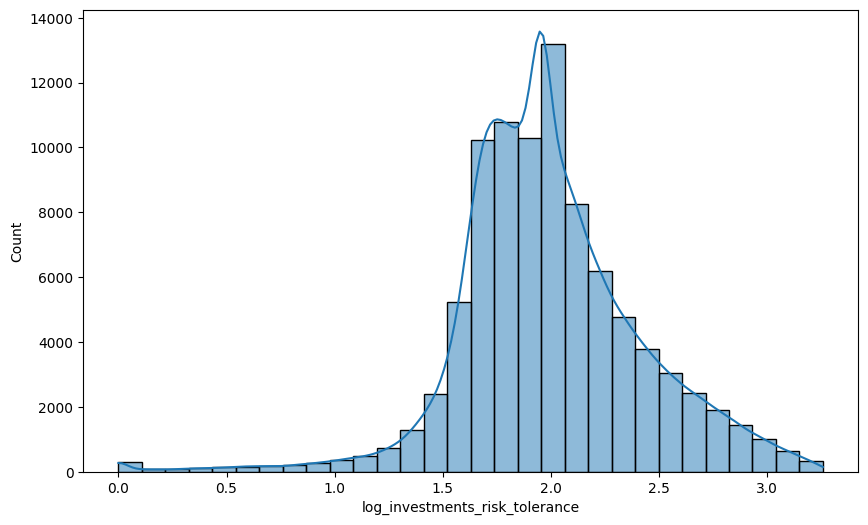

In [127]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_investments_risk_tolerance'], bins=30, kde=True)
plt.show()

#### **test data**


In [128]:
test_data['investments_risk_tolerance'].value_counts().sort_index()

investments_risk_tolerance
0.0000     92
0.0030      1
0.0134      1
0.0205      2
0.0214      1
           ..
34.5510     1
35.6423     1
35.9763     1
40.1498     1
43.9090     1
Name: count, Length: 30923, dtype: int64

In [129]:
#Turn outliers (values above 25) to NaN
test_data.loc[test_data['investments_risk_tolerance'] > 25, 'investments_risk_tolerance'] = np.nan

test_data['investments_risk_tolerance'].fillna(median_investments_risk_tolerance, inplace=True)

In [130]:
# We will impute the missing values with the median of the train data
test_data['investments_risk_tolerance'] = imputer.fit_transform(test_data[['investments_risk_tolerance']])

In [131]:
# Calculate the number of missing values
missing_values_count = test_data['investments_risk_tolerance'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(test_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in investments_risk_tolerance: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in investments_risk_tolerance: 0 (0.00%)


In [132]:
# create log variable
test_data['log_investments_risk_tolerance'] = np.log(test_data['investments_risk_tolerance']+1)

## <font color=72beea> **tech_savviness_score** </font>

#### **train data**


In [133]:
train_data['tech_savviness_score'].value_counts().sort_index()

tech_savviness_score
6.8615     1
7.4913     1
7.6873     1
7.6979     1
7.7115     1
          ..
26.5109    1
26.9743    1
27.5119    1
29.6995    1
30.4336    1
Name: count, Length: 44246, dtype: int64

<Axes: >

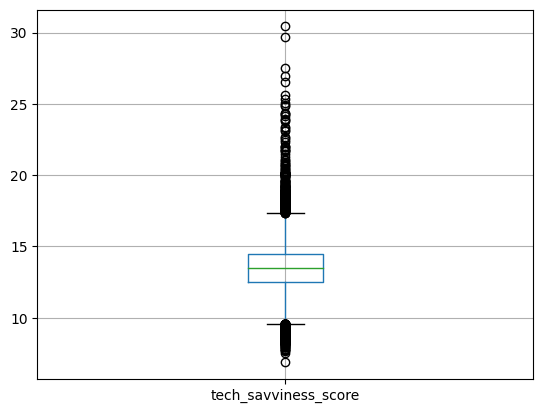

In [134]:
train_data.boxplot(column='tech_savviness_score')

<Figure size 600x400 with 0 Axes>

<Axes: xlabel='tech_savviness_score', ylabel='Density'>

Text(0.5, 1.0, 'Tech Savviness Score Density Plot')

Text(0.5, 0, 'Tech Savviness Score')

Text(0, 0.5, 'Density')

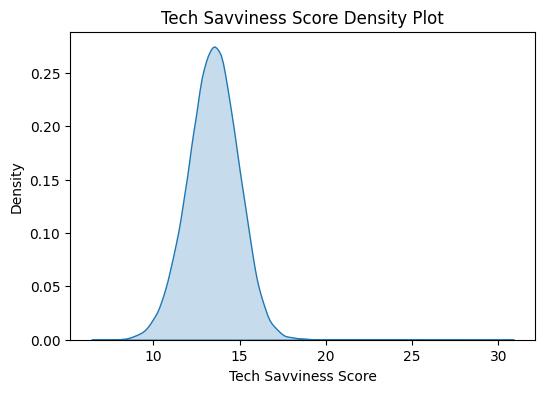

In [135]:
plt.figure(figsize=(6, 4))
sns.kdeplot(train_data['tech_savviness_score'], shade=True)

plt.title('Tech Savviness Score Density Plot')
plt.xlabel('Tech Savviness Score')
plt.ylabel('Density')

plt.show()

In [136]:
below_8 = (train_data['tech_savviness_score'] < 8).sum()
above_20 = (train_data['tech_savviness_score'] > 20).sum()

print("Number of observations below 8:", below_8)
print("Number of observations above 20:", above_20)

print("Total number of outliers:", below_8 + above_20)
print("Percentage of outliers:", round((below_8 + above_20)/train_data['tech_savviness_score'].count()*100, 2), "%")

Number of observations below 8: 11
Number of observations above 20: 61
Total number of outliers: 72
Percentage of outliers: 0.08 %


In [137]:
# Since distribution resembles normal, mean ~= median
mean = train_data['tech_savviness_score'].mean()

train_data.loc[train_data['tech_savviness_score'] > 20, 'tech_savviness_score'] = mean
train_data.loc[train_data['tech_savviness_score'] < 8, 'tech_savviness_score'] = mean

<Axes: >

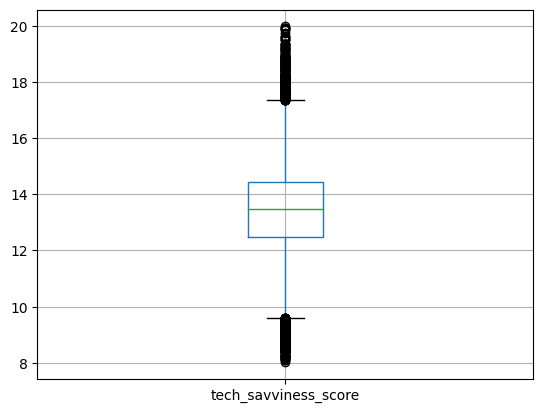

In [138]:
train_data.boxplot(column='tech_savviness_score')

In [139]:
# We will impute the missing values with the mean
imputer = SimpleImputer(strategy='mean')
train_data['tech_savviness_score'] = imputer.fit_transform(train_data[['tech_savviness_score']])

#### **test data**

In [140]:
test_data['tech_savviness_score'].value_counts().sort_index()

tech_savviness_score
6.9966     1
7.6897     1
7.7147     1
8.0821     1
8.0877     1
          ..
24.7837    1
26.4029    1
28.1134    1
28.4361    1
31.3096    1
Name: count, Length: 27111, dtype: int64

In [141]:
test_data.loc[test_data['tech_savviness_score'] > 20, 'tech_savviness_score'] = mean
test_data.loc[test_data['tech_savviness_score'] < 8, 'tech_savviness_score'] = mean

In [142]:
test_data['tech_savviness_score'] = imputer.transform(test_data[['tech_savviness_score']])

## <font color=72beea> **social_media_influence_score** </font>

#### **train data**

In [143]:
train_data['social_media_influence_score'].value_counts().sort_index()

social_media_influence_score
0.0000     17
0.0035      1
0.0111      1
0.0468      1
0.0491      1
           ..
38.4961     1
42.1768     1
42.2670     1
44.0519     1
44.9659     1
Name: count, Length: 60811, dtype: int64

<Axes: >

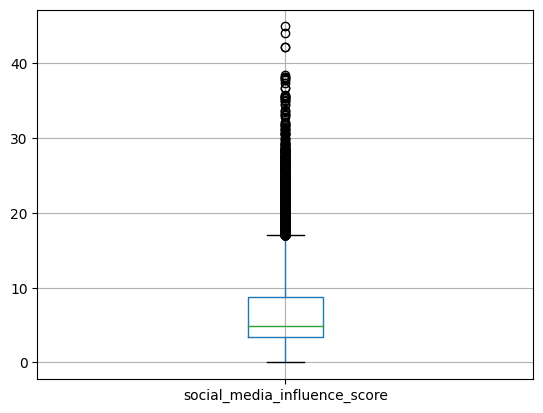

In [144]:
train_data.boxplot(column='social_media_influence_score')

In [145]:
median = train_data['social_media_influence_score'].median()

Q1 = train_data['social_media_influence_score'].quantile(0.25)
Q3 = train_data['social_media_influence_score'].quantile(0.75)

IQR = Q3 - Q1
cutoff = Q3 + 1.5 * IQR

train_data.loc[train_data['social_media_influence_score'] > cutoff, 'social_media_influence_score'] = median

<Axes: >

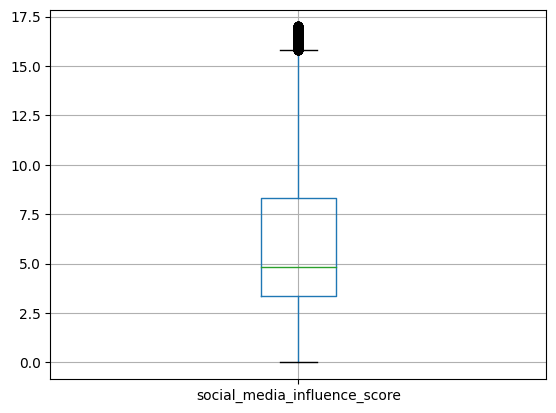

In [146]:
train_data.boxplot(column='social_media_influence_score')

In [147]:
# We will impute the missing values with the median
imputer = SimpleImputer(strategy='median')
train_data['social_media_influence_score'] = imputer.fit_transform(train_data[['social_media_influence_score']])

#### **test data**

In [148]:
test_data['social_media_influence_score'].value_counts().sort_index()

social_media_influence_score
0.0000     7
0.0210     1
0.0274     1
0.0761     1
0.0823     1
          ..
34.1185    1
35.2691    1
35.7853    1
38.6190    1
44.3368    1
Name: count, Length: 31382, dtype: int64

In [149]:
test_data.loc[test_data['social_media_influence_score'] > cutoff, 'social_media_influence_score'] = median

In [150]:
test_data['social_media_influence_score'] = imputer.transform(test_data[['social_media_influence_score']])

## <font color=72beea> **entertainment_engagement_factor** </font>

#### **train data**

In [151]:
train_data['entertainment_engagement_factor'].value_counts().sort_index()

entertainment_engagement_factor
0.28040      1
0.32690      1
0.33120      1
0.39580      2
0.39930      1
          ... 
3.00530      1
3.02920      1
3.03510      1
3.12970      1
3.69071    175
Name: count, Length: 16016, dtype: int64

<Axes: >

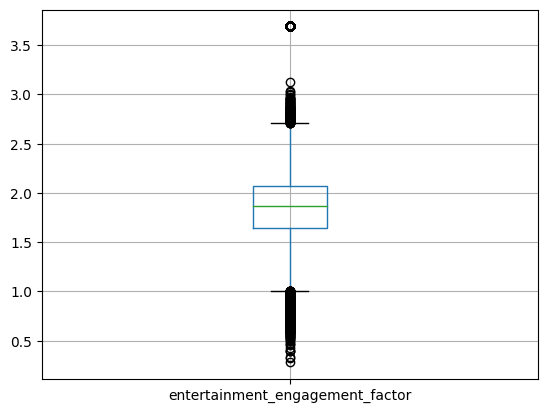

In [152]:
train_data.boxplot(column='entertainment_engagement_factor')

<Figure size 600x400 with 0 Axes>

<Axes: xlabel='entertainment_engagement_factor', ylabel='Density'>

Text(0.5, 0, 'Entertainment Engagement Factor')

Text(0, 0.5, 'Density')

Text(0.5, 1.0, 'Entertainment Engagement Factor Density Plot')

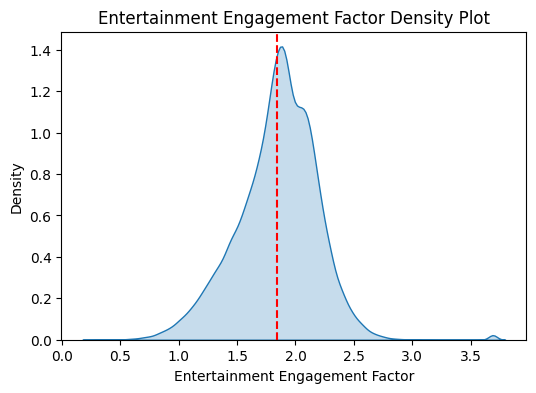

In [153]:
plt.figure(figsize=(6, 4))
sns.kdeplot(train_data['entertainment_engagement_factor'], shade=True)

mean_value = np.mean(train_data['entertainment_engagement_factor'])
median_value = np.median(train_data['entertainment_engagement_factor'])

plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.axvline(median_value, color='blue', linestyle='-.', label='Median')

plt.xlabel('Entertainment Engagement Factor')
plt.ylabel('Density')
plt.title('Entertainment Engagement Factor Density Plot')

plt.show()

In [154]:
median = train_data['entertainment_engagement_factor'].median()

Q1 = train_data['entertainment_engagement_factor'].quantile(0.25)
Q3 = train_data['entertainment_engagement_factor'].quantile(0.75)

IQR = Q3 - Q1
cutoff_left = Q1 - 2.5 * IQR
cutoff_right = Q3 + 2.5 * IQR

train_data.loc[train_data['entertainment_engagement_factor'] > cutoff_right, 'entertainment_engagement_factor'] = median
train_data.loc[train_data['entertainment_engagement_factor'] < cutoff_left, 'entertainment_engagement_factor'] = median

<Axes: >

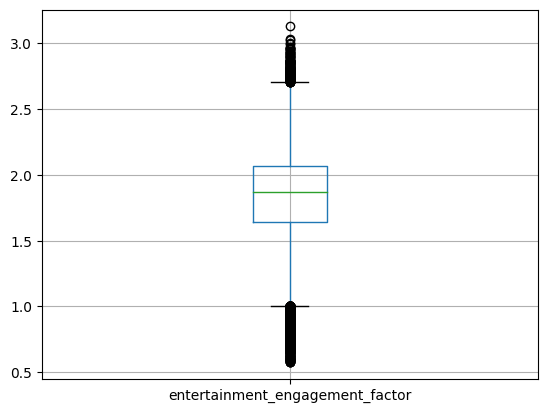

In [155]:
train_data.boxplot(column='entertainment_engagement_factor')

<Figure size 600x400 with 0 Axes>

<Axes: xlabel='entertainment_engagement_factor', ylabel='Density'>

Text(0.5, 0, 'Entertainment Engagement Factor')

Text(0, 0.5, 'Density')

Text(0.5, 1.0, 'Entertainment Engagement Factor Density Plot')

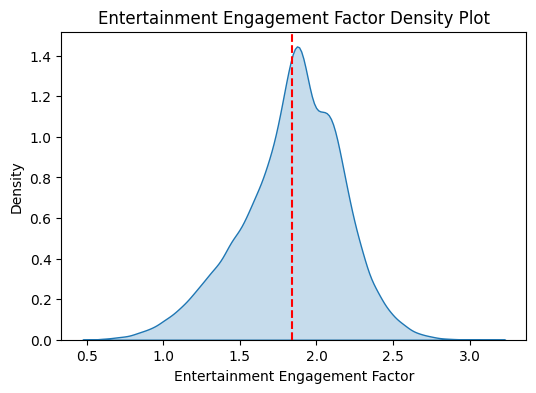

In [156]:
plt.figure(figsize=(6, 4))
sns.kdeplot(train_data['entertainment_engagement_factor'], shade=True)

mean_value = np.mean(train_data['entertainment_engagement_factor'])
median_value = np.median(train_data['entertainment_engagement_factor'])

plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.axvline(median_value, color='blue', linestyle='-.', label='Median')

plt.xlabel('Entertainment Engagement Factor')
plt.ylabel('Density')
plt.title('Entertainment Engagement Factor Density Plot')

plt.show()

In [157]:
# We will impute the missing values with the mean
imputer = SimpleImputer(strategy='mean')
train_data['entertainment_engagement_factor'] = imputer.fit_transform(train_data[['entertainment_engagement_factor']])

In [158]:
train_data['tech_savviness_score'].isnull().sum()

0

#### **test data**

In [159]:
test_data['entertainment_engagement_factor'].value_counts().sort_index()

entertainment_engagement_factor
0.32000      1
0.33730      1
0.34420      1
0.35430      1
0.43160      1
          ... 
2.93730      1
2.93840      1
3.01050      1
3.01870      1
3.34155    186
Name: count, Length: 12724, dtype: int64

In [160]:
test_data.loc[test_data['entertainment_engagement_factor'] > cutoff_right, 'entertainment_engagement_factor'] = median
test_data.loc[test_data['entertainment_engagement_factor'] < cutoff_left, 'entertainment_engagement_factor'] = median

In [161]:
test_data['entertainment_engagement_factor'] = imputer.transform(test_data[['entertainment_engagement_factor']])

## <font color=72beea> **avg_monthly_entertainment_expenses** </font>

#### **train data**

In [162]:
train_data['avg_monthly_entertainment_expenses'].value_counts().sort_index()

avg_monthly_entertainment_expenses
0.0000      9
0.1342      1
0.1388      1
0.1747      1
0.1946      1
           ..
159.5440    1
165.6130    1
165.6310    1
176.8650    1
180.5290    1
Name: count, Length: 77875, dtype: int64

In [163]:
px.scatter(train_data, y="avg_monthly_entertainment_expenses")

<Axes: xlabel='avg_monthly_entertainment_expenses', ylabel='Count'>

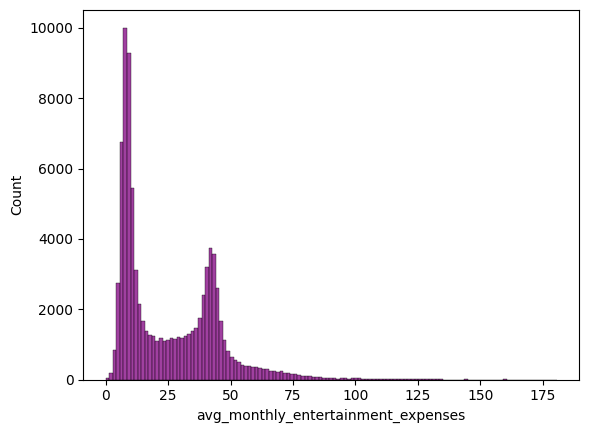

In [164]:
sns.histplot(train_data['avg_monthly_entertainment_expenses'], color='purple')

In [165]:
#Turn outliers (values above 120) as NaN
train_data['avg_monthly_entertainment_expenses'] = np.where(train_data['avg_monthly_entertainment_expenses'] > 120, np.nan, train_data['avg_monthly_entertainment_expenses'])

In [166]:
px.box(train_data, y='avg_monthly_entertainment_expenses')

In [167]:
median_value = train_data['avg_monthly_entertainment_expenses'].median()
print(f"Median for avg_monthly_entertainment_expenses: {median_value}")
mean_value = train_data['avg_monthly_entertainment_expenses'].mean()
print(f"Mean for avg_monthly_entertainment_expenses: {mean_value}")

Median for avg_monthly_entertainment_expenses: 18.1098
Mean for avg_monthly_entertainment_expenses: 25.144222160779783


In [168]:
# We will impute the missing values with the median
imputer = SimpleImputer(strategy='median')
train_data['avg_monthly_entertainment_expenses'] = imputer.fit_transform(train_data[['avg_monthly_entertainment_expenses']])

In [169]:
# Calculate the number of missing values
missing_values_count = train_data['avg_monthly_entertainment_expenses'].isnull().sum()

# Calculate the percentage of missing values
total_values = len(train_data)
missing_values_percentage = (missing_values_count / total_values) * 100

print(f"Number of missing values in avg_monthly_entertainment_expenses: {missing_values_count} ({missing_values_percentage:.2f}%)")

Number of missing values in avg_monthly_entertainment_expenses: 0 (0.00%)


In [170]:
total_records = train_data['avg_monthly_entertainment_expenses'].value_counts()
print(f"Total number of records for avg_monthly_entertainment_expenses: {total_records}")

Total number of records for avg_monthly_entertainment_expenses: avg_monthly_entertainment_expenses
18.1098    1008
0.0000        9
8.6178        5
8.1746        5
5.7287        5
           ... 
43.7240       1
18.8212       1
23.8387       1
23.0636       1
11.4332       1
Name: count, Length: 77771, dtype: int64


In [171]:
# create log variable
train_data['log_avg_monthly_entertainment_expenses'] = np.log(train_data['avg_monthly_entertainment_expenses']+1)

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_avg_monthly_entertainment_expenses', ylabel='Count'>

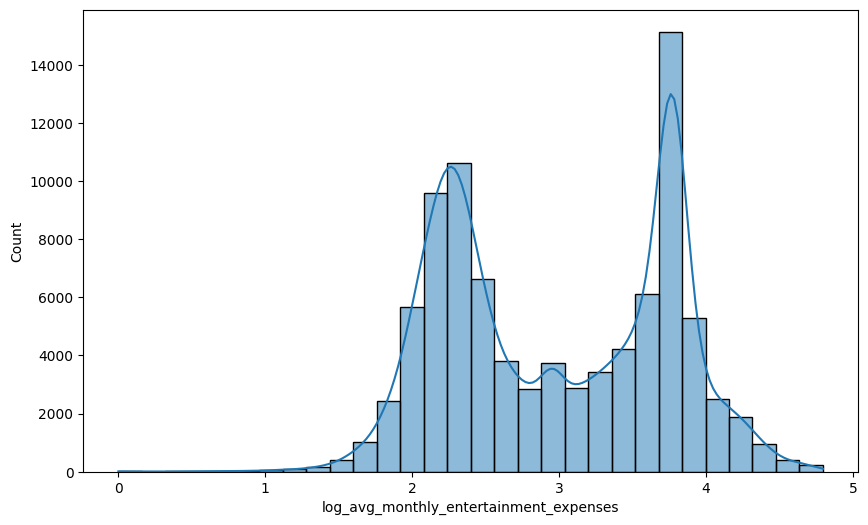

In [172]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_avg_monthly_entertainment_expenses'], bins=30, kde=True)
plt.show()

#### **test data**

In [173]:
test_data['avg_monthly_entertainment_expenses'].value_counts().sort_index()

avg_monthly_entertainment_expenses
0.0000      4
0.0640      1
0.2880      1
0.3396      1
0.3728      1
           ..
146.8980    1
147.2720    1
150.8410    1
152.1570    1
153.6730    1
Name: count, Length: 35815, dtype: int64

In [174]:
#Turn outliers (values above 120) as NaN
test_data['avg_monthly_entertainment_expenses'] = np.where(test_data['avg_monthly_entertainment_expenses'] > 120, np.nan, test_data['avg_monthly_entertainment_expenses'])

In [175]:
# We will impute the missing values with the median
test_data['avg_monthly_entertainment_expenses'] = imputer.transform(test_data[['avg_monthly_entertainment_expenses']])

In [176]:
# create log variable
test_data['log_avg_monthly_entertainment_expenses'] = np.log(test_data['avg_monthly_entertainment_expenses']+1)

## <font color=72beea> **avg_weekly_exercise_hours** </font>

#### **train data**

In [177]:
train_data['avg_weekly_exercise_hours'].value_counts().sort_index()

avg_weekly_exercise_hours
-6.6016    1
-4.9667    1
-4.8917    1
-4.8132    1
-4.7042    1
          ..
 8.2294    1
 8.2503    1
 8.6530    1
 8.7780    1
 9.4168    1
Name: count, Length: 27417, dtype: int64

In [178]:
# Turn negative values into positive using absolute, we considered the negative values as an human error
train_data['avg_weekly_exercise_hours'] = train_data['avg_weekly_exercise_hours'].abs()

In [179]:
px.scatter(train_data, y="avg_weekly_exercise_hours")

In [180]:
px.box(train_data, y='avg_weekly_exercise_hours')

<Axes: xlabel='avg_weekly_exercise_hours', ylabel='Count'>

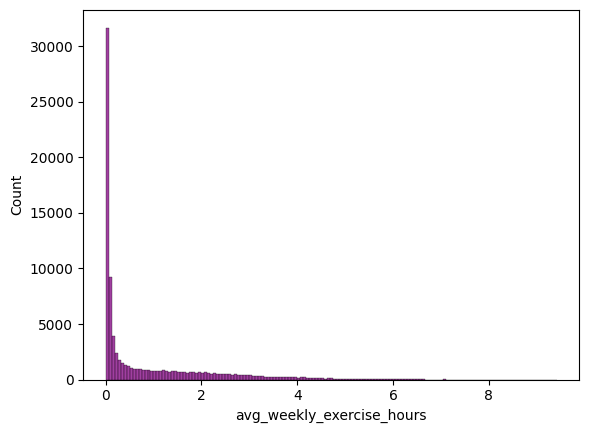

In [181]:
sns.histplot(train_data['avg_weekly_exercise_hours'], color='purple')

In [182]:
Q1 = train_data['avg_weekly_exercise_hours'].quantile(0.25)
Q3 = train_data['avg_weekly_exercise_hours'].quantile(0.75)
IQR = Q3 - Q1

outliers = train_data[(train_data['avg_weekly_exercise_hours'] < (Q1-1.5*IQR)) | (train_data['avg_weekly_exercise_hours'] > (Q3+1.5*IQR))]
outliers

,citizen_id,last_year_avg_monthly_charity_donations,environmental_awareness_rating,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type,gender_encoded,age,log_environmental_awareness_rating,log_investment_portfolio_value,log_investments_risk_tolerance,log_avg_monthly_entertainment_expenses
6,7,0.0,0.6770,4.6110,6.5316,7.8508,10.959800,13.869200,2.1426,42.0723,4.4873,3.3746,3.0657,106.3840,Fitness Enthusiast,0,20,0.517006,1.528445,2.180508,3.762880
51,52,0.0,1.5184,4.6110,1.2878,6.7555,13.294200,2.817800,1.7411,8.7144,4.2584,0.7282,2.2213,101.6090,Adventure Seeker,1,20,0.923624,1.528445,2.048402,2.273609
65,66,0.0,2.0510,2.1298,0.2106,5.3526,11.644800,2.979900,1.5201,8.8528,3.5434,0.6111,2.0371,99.1233,Fitness Enthusiast,0,21,1.115469,0.756028,1.848864,2.287756
103,104,0.0,0.4926,4.6110,7.1035,10.3572,13.453791,4.802325,1.3839,11.5017,6.1296,4.0699,2.3845,107.1250,Fitness Enthusiast,0,23,0.400520,1.528445,2.429852,2.525865
121,122,0.0,0.6594,4.6110,1.0490,4.3763,13.388100,14.665500,2.1451,42.2873,4.0306,1.5183,3.1574,110.3660,Fitness Enthusiast,1,43,0.506456,1.528445,1.682000,3.767859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89997,89998,0.0,0.4775,4.6110,7.3201,7.7381,14.360600,6.068200,2.2968,51.2378,4.2087,1.7850,3.4104,111.4130,Fitness Enthusiast,0,50,0.390351,1.528445,2.167693,3.955806
90032,90033,0.0,0.6298,4.6110,2.4802,4.7535,12.847100,10.777700,1.4738,9.3158,5.9097,3.2089,2.5353,105.5400,Fitness Enthusiast,1,28,0.488457,1.528445,1.749808,2.333677
90051,90052,0.0,1.3177,8.1972,7.1519,12.0159,13.022200,1.489700,1.4321,32.4370,4.5293,1.5699,1.8885,111.5610,Fitness Enthusiast,1,49,0.840575,2.103793,2.566172,3.509663
90075,90076,0.0,1.5197,4.6110,7.3948,16.4628,14.308000,3.660900,2.0955,46.3387,5.1239,0.9815,4.0447,117.0480,Adventure Seeker,0,58,0.924140,1.528445,2.860073,3.857328


In [183]:
# Since the boxplot and IQR show a lot of outliers and we don't want to delete many records, we consider values above 6 as outliers
# Turn outliers (values above 6) to NaN

train_data['avg_weekly_exercise_hours'] = np.where(train_data['avg_weekly_exercise_hours'] > 6, np.nan, train_data['avg_weekly_exercise_hours'])

In [184]:
# KNN for missing values of avg_weekly_exercise_hours
imputer_avg_weekly_exercise = KNNImputer(n_neighbors=round(np.sqrt(len(train_data))))

train_data['avg_weekly_exercise_hours'] = imputer_avg_weekly_exercise.fit_transform(train_data[['avg_weekly_exercise_hours']])


In [185]:
total_records = train_data['avg_weekly_exercise_hours'].value_counts().sum()
print(f"Total number of records for avg_weekly_exercise_hours: {total_records}")

Total number of records for avg_weekly_exercise_hours: 90160


In [186]:
# create log variable
train_data['log_avg_weekly_exercise_hours'] = np.log(train_data['avg_weekly_exercise_hours']+1)

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_avg_weekly_exercise_hours', ylabel='Count'>

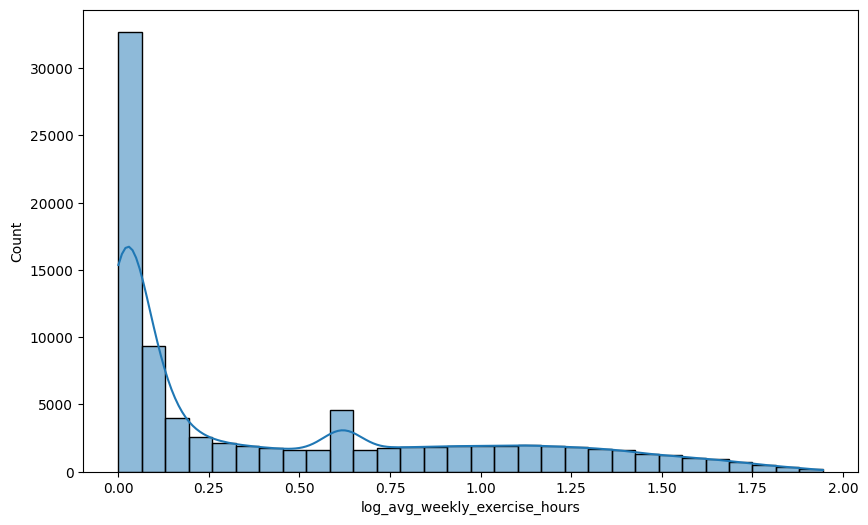

In [187]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_avg_weekly_exercise_hours'], bins=30, kde=True)
plt.show()

#### **test data**

In [188]:
test_data['avg_weekly_exercise_hours'].value_counts().sort_index()

avg_weekly_exercise_hours
-3.8981    1
-3.5110    1
-3.4026    1
-2.9937    1
-2.9925    1
          ..
 7.6423    1
 7.7997    1
 7.8275    1
 7.9996    1
 8.3377    1
Name: count, Length: 16021, dtype: int64

In [189]:
# Turn negative values into positive using absolute, we considered the negative values as an human error
test_data['avg_weekly_exercise_hours'] = test_data['avg_weekly_exercise_hours'].abs()

In [190]:
# Turn outliers (values above 6) as NaN

test_data['avg_weekly_exercise_hours'] = np.where(test_data['avg_weekly_exercise_hours'] > 6, np.nan, test_data['avg_weekly_exercise_hours'])

In [191]:
test_data['avg_weekly_exercise_hours'] = imputer_avg_weekly_exercise.transform(test_data[['avg_weekly_exercise_hours']])

In [192]:
# create log variable
test_data['log_avg_weekly_exercise_hours'] = np.log(test_data['avg_weekly_exercise_hours']+1)

## <font color=72beea> **health_consciousness_rating** </font>

#### **train data**

In [193]:
train_data['health_consciousness_rating'].value_counts().sort_index()

health_consciousness_rating
0.0000     479
0.0002       1
0.0003       1
0.0004       1
0.0005       1
          ... 
10.6762      1
10.9942      1
11.7817      1
12.1378      1
13.4316      1
Name: count, Length: 27692, dtype: int64

In [194]:
px.scatter(train_data, y="health_consciousness_rating")

In [195]:
# Turn health_consciousness_rating into 0-10 scale
train_data['health_consciousness_rating'] = train_data['health_consciousness_rating'].clip(lower=0, upper=10)

In [196]:
px.box(train_data, y='health_consciousness_rating')

<Axes: xlabel='health_consciousness_rating', ylabel='Count'>

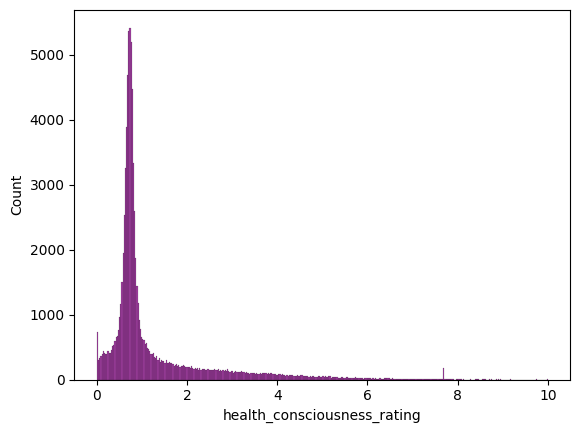

In [197]:
sns.histplot(train_data['health_consciousness_rating'], color='purple')

In [198]:
# We don't want to delete many records, therefore we will consider values above 6 as outliers. Turning them into NaN
train_data['health_consciousness_rating'] = np.where(train_data['health_consciousness_rating'] > 7, np.nan, train_data['health_consciousness_rating'])

In [199]:
# Count the number of NaN values in the health_consciousness_rating
missing_health_consciousness_count = train_data['health_consciousness_rating'].isna().sum()

print(f"Number of NaN values in health_consciousness_rating: {missing_health_consciousness_count}")

Number of NaN values in health_consciousness_rating: 1369


In [200]:
# We will impute the missing values with the median because the number of records is low and the data is not normally distributed

imputer = SimpleImputer(strategy='median')
train_data['health_consciousness_rating'] = imputer.fit_transform(train_data[['health_consciousness_rating']])

<Axes: xlabel='health_consciousness_rating', ylabel='Count'>

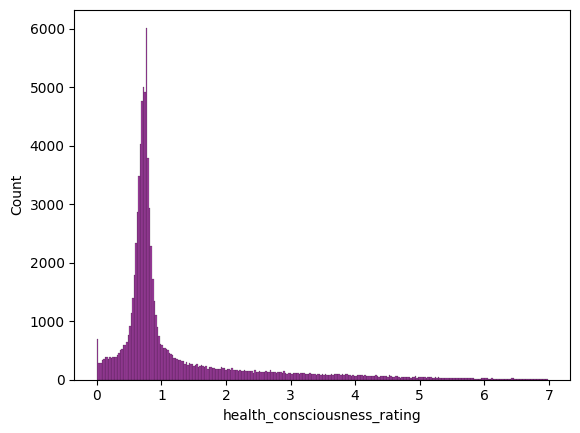

In [201]:
sns.histplot(train_data['health_consciousness_rating'], color='purple')

In [202]:
# create log variable
train_data['log_health_consciousness_rating'] = np.log(train_data['health_consciousness_rating']+1)

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='log_health_consciousness_rating', ylabel='Count'>

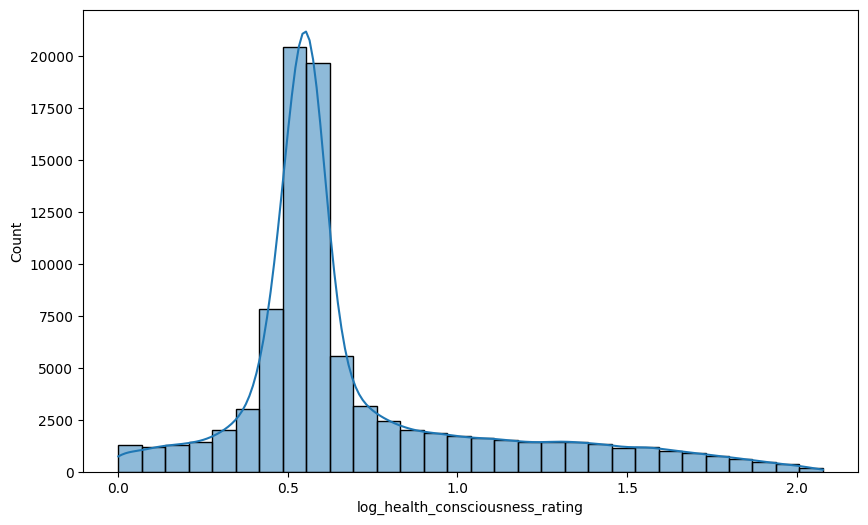

In [203]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['log_health_consciousness_rating'], bins=30, kde=True)
plt.show()

#### **test data**

In [204]:
test_data['health_consciousness_rating'].value_counts().sort_index()

health_consciousness_rating
0.0000     212
0.0002       1
0.0004       1
0.0009       1
0.0013       1
          ... 
9.4748       1
9.5110       1
9.5763       1
9.9773       1
11.0553      1
Name: count, Length: 16735, dtype: int64

In [205]:
# Turn health_consciousness_rating into 0-10 scale
test_data['health_consciousness_rating'] = test_data['health_consciousness_rating'].clip(lower=0, upper=10)

In [206]:
# We don't want to delete many records, therefore we will consider values above 6 as outliers. Turning them into NaN
test_data['health_consciousness_rating'] = np.where(test_data['health_consciousness_rating'] > 7, np.nan, test_data['health_consciousness_rating'])

In [207]:
test_data['health_consciousness_rating'] = imputer.transform(test_data[['health_consciousness_rating']])

In [208]:
# create log variable
test_data['log_health_consciousness_rating'] = np.log(test_data['health_consciousness_rating']+1)

## <font color=72beea> **stress_management_score** </font>

#### **train data**

In [209]:
train_data['stress_management_score'].value_counts().sort_index()

stress_management_score
0.00000      1
0.00310      1
0.06680      1
0.06720      1
0.08230      1
          ... 
8.77942    173
8.85420      1
8.87430      1
8.98250      1
9.31820      1
Name: count, Length: 37194, dtype: int64

In [210]:
train_data['stress_management_score'].skew() # right skwed

0.7564730201703579

In [211]:
#outliers
px.box(train_data, y="stress_management_score")

In [212]:
# variables with correlation = 0.78
px.scatter(train_data, x = 'stress_management_score', y = 'entertainment_engagement_factor',  trendline="ols")

Output hidden; open in https://colab.research.google.com to view.

In [213]:
train_data.loc[train_data['stress_management_score'] > 8, 'stress_management_score'] = np.nan
median_stress_management_score = train_data['stress_management_score'].median()
train_data['stress_management_score'].fillna(median_stress_management_score, inplace=True)

In [214]:
train_data['stress_management_score'].value_counts().sort_index()

stress_management_score
0.0000    1
0.0031    1
0.0668    1
0.0672    1
0.0823    1
         ..
7.9249    1
7.9255    1
7.9568    1
7.9681    1
7.9922    1
Name: count, Length: 37151, dtype: int64

In [215]:
px.box(train_data, y="stress_management_score")
px.scatter(train_data, x = 'stress_management_score', y = 'entertainment_engagement_factor',  trendline="ols")

Output hidden; open in https://colab.research.google.com to view.

In [216]:
missing_values_table(train_data)

Your dataframe has 23 columns.
There are 1 columns that have missing values.
Your dataframe has 90160 rows.
There are 902 rows that have missing values.



,Missing Values,% of Total Values
overall_well_being,902,1.0


#### **test data**

In [217]:
test_data['stress_management_score'].value_counts().sort_index()

stress_management_score
0.0000    2
0.0522    1
0.1980    1
0.2069    1
0.2528    1
         ..
8.6472    1
8.6517    1
8.6976    1
8.8416    1
8.8876    1
Name: count, Length: 23992, dtype: int64

In [218]:
test_data.loc[test_data['stress_management_score'] > 8, 'stress_management_score'] = np.nan

test_data['stress_management_score'].fillna(median_stress_management_score, inplace=True)

## <font color=72beea> **overall_well_being** </font>

#### **train data**

In [219]:
train_data['overall_well_being'].value_counts().sort_index()

overall_well_being
4.99760      1
5.06775      1
5.20825      1
5.24650      1
5.33805      1
            ..
479.28000    1
491.19900    1
500.14200    1
560.71800    1
600.83000    1
Name: count, Length: 52432, dtype: int64

In [220]:
px.box(train_data, y="overall_well_being")

In [221]:
# Replace values over 350 with NaN
train_data.loc[train_data['overall_well_being'] > 350, 'overall_well_being'] = np.nan

In [222]:
missing_values_table(train_data)

Your dataframe has 23 columns.
There are 1 columns that have missing values.
Your dataframe has 90160 rows.
There are 1208 rows that have missing values.



,Missing Values,% of Total Values
overall_well_being,1208,1.3


In [223]:
px.box(train_data, y="overall_well_being")

In [224]:
px.histogram(train_data, x="overall_well_being")

In [225]:
imputer = KNNImputer(n_neighbors=round(np.sqrt(len(train_data))))

# Impute missing values
train_data[['overall_well_being']] = imputer.fit_transform(train_data[['overall_well_being']])

In [226]:
px.histogram(train_data, x="overall_well_being")

In [227]:
missing_values_table(train_data)

Your dataframe has 23 columns.
There are 0 columns that have missing values.
Your dataframe has 90160 rows.
There are 0 rows that have missing values.



,Missing Values,% of Total Values


#### **test data**

In [228]:
test_data['overall_well_being'].value_counts().sort_index()

overall_well_being
5.31450      1
5.32025      1
5.40480      1
5.56760      1
5.66920      1
            ..
443.09900    1
446.63600    1
450.47100    1
488.49200    1
545.81500    1
Name: count, Length: 27728, dtype: int64

In [229]:
# Replace values over 350 with NaN
test_data.loc[test_data['overall_well_being'] > 350, 'overall_well_being'] = np.nan

In [230]:
# Impute missing values
test_data['overall_well_being'] = imputer.transform(test_data[['overall_well_being']])

In [231]:
missing_values_table(test_data)

Your dataframe has 22 columns.
There are 0 columns that have missing values.
Your dataframe has 38643 rows.
There are 0 rows that have missing values.



,Missing Values,% of Total Values


## <font color=72beea> **lifestyle_type** </font>

In [232]:
value_counts = train_data['lifestyle_type'].value_counts().sort_index()
percentages = value_counts / value_counts.sum() * 100

counts_and_percentages = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(counts_and_percentages)

                    Count  Percentage
lifestyle_type                       
Adventure Seeker    18001   19.965617
Fitness Enthusiast  18033   20.001109
Health-Conscious    18130   20.108696
Investor            18058   20.028838
Travel Enthusiast   17938   19.895741


In [233]:
encoder = LabelEncoder()
train_data['lifestyle_encoded'] = encoder.fit_transform(train_data['lifestyle_type'])
train_data.head()

,citizen_id,last_year_avg_monthly_charity_donations,environmental_awareness_rating,investment_portfolio_value,investments_risk_appetite,investments_risk_tolerance,tech_savviness_score,social_media_influence_score,entertainment_engagement_factor,avg_monthly_entertainment_expenses,avg_weekly_exercise_hours,health_consciousness_rating,stress_management_score,overall_well_being,lifestyle_type,gender_encoded,age,log_environmental_awareness_rating,log_investment_portfolio_value,log_investments_risk_tolerance,log_avg_monthly_entertainment_expenses,log_avg_weekly_exercise_hours,log_health_consciousness_rating,lifestyle_encoded
0,1,0.0,1.9352,4.6110,3.5313,6.06605,11.9772,9.9506,1.7575,23.0605,0.1776,0.6504,2.8850,106.282,Travel Enthusiast,1,32,1.076776,1.528445,1.955302,3.180571,0.163478,0.501018,4
1,2,0.0,0.5672,5.4308,6.6175,13.64450,11.8776,5.1521,1.9677,18.1098,1.2782,1.0190,3.5777,132.121,Fitness Enthusiast,1,19,0.449291,1.692086,2.684065,2.950201,0.823386,0.702602,1
2,3,1.0,0.5613,4.6110,6.9319,5.88670,14.4247,3.6737,1.8693,37.5970,0.0354,3.0854,5.1906,115.547,Health-Conscious,1,19,0.445519,1.528445,1.929592,3.653175,0.034788,1.407420,2
3,4,0.0,0.3543,4.6110,7.0968,9.10740,12.3668,5.5798,1.5769,8.2142,1.7763,0.3677,3.0736,101.773,Fitness Enthusiast,1,43,0.303285,1.528445,2.313268,2.220746,1.021119,0.313130,1
4,5,0.0,0.5943,4.6110,5.8014,4.08920,15.8389,3.7712,1.9558,14.3443,0.0000,0.6718,2.7076,264.451,Adventure Seeker,1,37,0.466435,1.528445,1.627121,2.730744,0.000000,0.513901,0


In [234]:
train_data.drop('lifestyle_type', axis=1, inplace=True)

## <font color=72beea> **2.3. Feature Engineering** </font>

### <font color=72beea> **2.3.1. Health Index** </font>

<Axes: xlabel='health_bins', ylabel='count'>

Text(0.5, 1.0, 'Health Consciousness Rating Bins')

Text(0.5, 0, 'Health Consciousness Rating')

Text(0, 0.5, 'Count')

<Axes: xlabel='stress_bins', ylabel='count'>

Text(0.5, 1.0, 'Stress Management Score Bins')

Text(0.5, 0, 'Stress Management Score')

Text(0, 0.5, 'Count')

<Axes: xlabel='exercise_bins', ylabel='count'>

Text(0.5, 1.0, 'Average Weekly Exercise Hours Bins')

Text(0.5, 0, 'Average Weekly Exercise Hours')

Text(0, 0.5, 'Count')

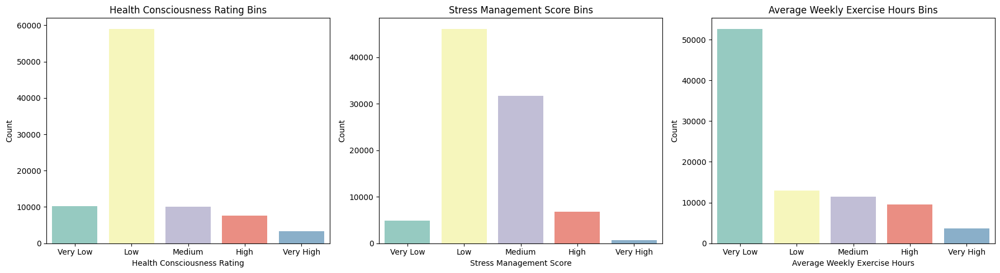

In [235]:
# Create 5 bins for existing attributes - train data
train_data['health_bins'] = pd.cut(train_data['log_health_consciousness_rating'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
train_data['stress_bins'] = pd.cut(train_data['stress_management_score'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
train_data['exercise_bins'] = pd.cut(train_data['log_avg_weekly_exercise_hours'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot for health_bins
sns.countplot(x='health_bins', data=train_data, ax=axes[0], palette='Set3')
axes[0].set_title('Health Consciousness Rating Bins')
axes[0].set_xlabel('Health Consciousness Rating')
axes[0].set_ylabel('Count')

# Plot for stress_bins
sns.countplot(x='stress_bins', data=train_data, ax=axes[1], palette='Set3')
axes[1].set_title('Stress Management Score Bins')
axes[1].set_xlabel('Stress Management Score')
axes[1].set_ylabel('Count')

# Plot for exercise_bins
sns.countplot(x='exercise_bins', data=train_data, ax=axes[2], palette='Set3')
axes[2].set_title('Average Weekly Exercise Hours Bins')
axes[2].set_xlabel('Average Weekly Exercise Hours')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [236]:
# Create 5 bins for existing attributes - test data
test_data['health_bins'] = pd.cut(test_data['log_health_consciousness_rating'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
test_data['stress_bins'] = pd.cut(test_data['stress_management_score'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
test_data['exercise_bins'] = pd.cut(test_data['log_avg_weekly_exercise_hours'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])

---

In [237]:
# Encode the bins as numerical values
# 0 very low; 1 low; 2 medium; 3 high; 4 very high
train_data['health_bins_encoded'] = train_data['health_bins'].cat.codes
train_data['stress_bins_encoded'] = train_data['stress_bins'].cat.codes
train_data['exercise_bins_encoded'] = train_data['exercise_bins'].cat.codes

test_data['health_bins_encoded'] = test_data['health_bins'].cat.codes
test_data['stress_bins_encoded'] = test_data['stress_bins'].cat.codes
test_data['exercise_bins_encoded'] = test_data['exercise_bins'].cat.codes

In [238]:
print(train_data[['health_bins', 'health_bins_encoded', 'stress_bins', 'stress_bins_encoded', 'exercise_bins', 'exercise_bins_encoded']])
print(test_data[['health_bins', 'health_bins_encoded', 'stress_bins', 'stress_bins_encoded', 'exercise_bins', 'exercise_bins_encoded']])

      health_bins  health_bins_encoded stress_bins  stress_bins_encoded  \
0             Low                    1         Low                    1   
1             Low                    1      Medium                    2   
2            High                    3        High                    3   
3        Very Low                    0         Low                    1   
4             Low                    1         Low                    1   
...           ...                  ...         ...                  ...   
90160      Medium                    2         Low                    1   
90161         Low                    1        High                    3   
90162      Medium                    2         Low                    1   
90163         Low                    1         Low                    1   
90164         Low                    1         Low                    1   

      exercise_bins  exercise_bins_encoded  
0          Very Low                      0  
1        

In [239]:
# create health_index variable
# train data
train_data['health_index'] = train_data['health_bins_encoded'] + train_data['stress_bins_encoded'] + train_data['exercise_bins_encoded']
train_data['health_index'].value_counts().sort_index()
# test data
test_data['health_index'] = test_data['health_bins_encoded'] + test_data['stress_bins_encoded'] + test_data['exercise_bins_encoded']
test_data['health_index'].value_counts().sort_index()

health_index
0       42
1     3954
2    21196
3    24297
4    15859
5    11673
6     8087
7     3778
8     1065
9      209
Name: count, dtype: int64

health_index
0        26
1      1558
2      9029
3     10518
4      6646
5      5111
6      3591
7      1610
8       439
9       109
10        5
11        1
Name: count, dtype: int64

<Axes: xlabel='health_index', ylabel='count'>

Text(0.5, 1.0, 'Health Index')

Text(0.5, 0, 'Health Index')

Text(0, 0.5, 'Count')

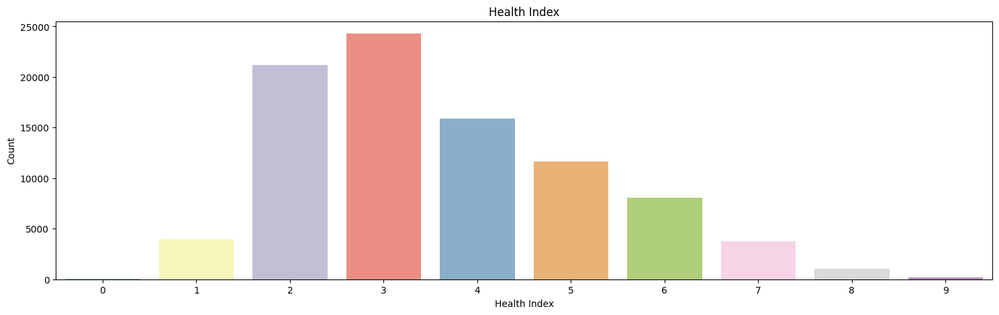

In [240]:
# Plotting
fig, ax = plt.subplots(figsize=(18, 5))

# Plot for health_index
sns.countplot(x='health_index', data=train_data, palette='Set3', ax=ax)
ax.set_title('Health Index')
ax.set_xlabel('Health Index')
ax.set_ylabel('Count')

### <font color=72beea> **2.3.2. Age** </font>

In [241]:
# Define custom age intervals and labels
age_intervals = [0, 18, 25, 35, 45, 60, 102]
age_labels = ["0-17", "18-24", "25-34", "35-44", "45-59", "60+"]

# Create bins for age using the defined intervals and labels
train_data['age_bins'] = pd.cut(train_data['age'], bins=age_intervals, labels=age_labels, right=False)
test_data['age_bins'] = pd.cut(test_data['age'], bins=age_intervals, labels=age_labels, right=False)

print(train_data[['age', 'age_bins']])
print(test_data[['age', 'age_bins']])

       age age_bins
0       32    25-34
1       19    18-24
2       19    18-24
3       43    35-44
4       37    35-44
...    ...      ...
90160   31    25-34
90161   42    35-44
90162   38    35-44
90163   21    18-24
90164   30    25-34

[90160 rows x 2 columns]
       age age_bins
0       37    35-44
1       58    45-59
2       35    35-44
3       50    45-59
4       29    25-34
...    ...      ...
38638   42    35-44
38639   40    35-44
38640   33    25-34
38641   34    25-34
38642   22    18-24

[38643 rows x 2 columns]


<Axes: xlabel='age_bins', ylabel='count'>

Text(0.5, 1.0, 'Age Bins')

Text(0.5, 0, 'Age Bins')

Text(0, 0.5, 'Count')

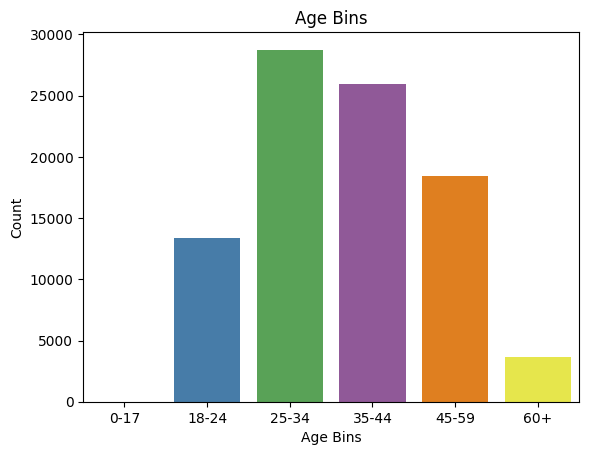

In [242]:
# Plot for age_bins
sns.countplot(x='age_bins', data=train_data, palette = "Set1")
plt.title('Age Bins')
plt.xlabel('Age Bins')
plt.ylabel('Count')

plt.show()

In [243]:
train_data['age_bins_encoded'] = train_data['age_bins'].cat.codes
test_data['age_bins_encoded'] = test_data['age_bins'].cat.codes

In [244]:
print(train_data[['age_bins', 'age_bins_encoded']])
print(test_data[['age_bins', 'age_bins_encoded']])

      age_bins  age_bins_encoded
0        25-34                 2
1        18-24                 1
2        18-24                 1
3        35-44                 3
4        35-44                 3
...        ...               ...
90160    25-34                 2
90161    35-44                 3
90162    35-44                 3
90163    18-24                 1
90164    25-34                 2

[90160 rows x 2 columns]
      age_bins  age_bins_encoded
0        35-44                 3
1        45-59                 4
2        35-44                 3
3        45-59                 4
4        25-34                 2
...        ...               ...
38638    35-44                 3
38639    35-44                 3
38640    25-34                 2
38641    25-34                 2
38642    18-24                 1

[38643 rows x 2 columns]


In [245]:
train_data['age_bins_encoded'].value_counts().sort_index()
test_data['age_bins_encoded'].value_counts().sort_index()

age_bins_encoded
1    13362
2    28750
3    25931
4    18468
5     3649
Name: count, dtype: int64

age_bins_encoded
1     5688
2    12475
3    10937
4     7975
5     1568
Name: count, dtype: int64

### <font color=72beea> **2.3.3. Investment Profile** </font>

<Axes: xlabel='portfolio_value_bins', ylabel='count'>

Text(0.5, 1.0, 'Investment Portfolio Value Bins')

Text(0.5, 0, 'Investment Portfolio Value')

Text(0, 0.5, 'Count')

<Axes: xlabel='risk_appetite_bins', ylabel='count'>

Text(0.5, 1.0, 'Investment Risk Apetite Bins')

Text(0.5, 0, 'Investment Risk Apetite')

Text(0, 0.5, 'Count')

<Axes: xlabel='risk_tolerance_bins', ylabel='count'>

Text(0.5, 1.0, 'Investment Risk Tolerance Bins')

Text(0.5, 0, 'Investment Risk Tolerance')

Text(0, 0.5, 'Count')

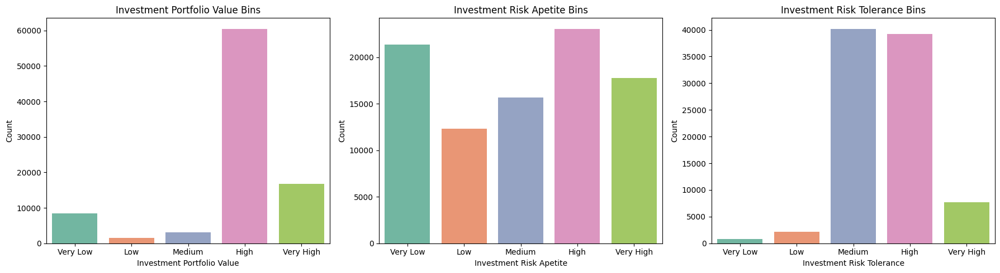

In [246]:
# Binning each variable into 3 bins
train_data['portfolio_value_bins'] = pd.cut(train_data['log_investment_portfolio_value'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
train_data['risk_appetite_bins'] = pd.cut(train_data['investments_risk_appetite'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
train_data['risk_tolerance_bins'] = pd.cut(train_data['log_investments_risk_tolerance'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot for portfolio_value_bins
sns.countplot(x='portfolio_value_bins', data=train_data, ax=axes[0], palette='Set2')
axes[0].set_title('Investment Portfolio Value Bins')
axes[0].set_xlabel('Investment Portfolio Value')
axes[0].set_ylabel('Count')

# Plot for risk_appetite_bins
sns.countplot(x='risk_appetite_bins', data=train_data, ax=axes[1], palette='Set2')
axes[1].set_title('Investment Risk Apetite Bins')
axes[1].set_xlabel('Investment Risk Apetite')
axes[1].set_ylabel('Count')

# Plot for risk_tolerance_bins
sns.countplot(x='risk_tolerance_bins', data=train_data, ax=axes[2], palette='Set2')
axes[2].set_title('Investment Risk Tolerance Bins')
axes[2].set_xlabel('Investment Risk Tolerance')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [247]:
test_data['portfolio_value_bins'] = pd.cut(test_data['log_investment_portfolio_value'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
test_data['risk_appetite_bins'] = pd.cut(test_data['investments_risk_appetite'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])
test_data['risk_tolerance_bins'] = pd.cut(test_data['log_investments_risk_tolerance'], bins=5, labels=["Very Low", "Low", "Medium", "High", "Very High"])

In [248]:
# Encode the bins as numerical values
# 0 very low; 1 low; 2 medium; 3 high; 4 very high
train_data['portfolio_value_bins_encoded'] = train_data['portfolio_value_bins'].cat.codes
train_data['risk_appetite_bins_encoded'] = train_data['risk_appetite_bins'].cat.codes
train_data['risk_tolerance_bins_encoded'] = train_data['risk_tolerance_bins'].cat.codes

test_data['portfolio_value_bins_encoded'] = test_data['portfolio_value_bins'].cat.codes
test_data['risk_appetite_bins_encoded'] = test_data['risk_appetite_bins'].cat.codes
test_data['risk_tolerance_bins_encoded'] = test_data['risk_tolerance_bins'].cat.codes

In [249]:
# create investment_profile variable
# train data
train_data['investment_profile'] = train_data['portfolio_value_bins_encoded'] + train_data['risk_appetite_bins_encoded'] + train_data['risk_tolerance_bins_encoded']
train_data['investment_profile'].value_counts().sort_index()
# test data
test_data['investment_profile'] = test_data['portfolio_value_bins_encoded'] + test_data['risk_appetite_bins_encoded'] + test_data['risk_tolerance_bins_encoded']
test_data['investment_profile'].value_counts().sort_index()

investment_profile
0         1
1        12
2      1280
3      2222
4      2593
5     11016
6     15419
7     13641
8     13309
9     12662
10    11305
11     5547
12     1153
Name: count, dtype: int64

investment_profile
1       11
2      556
3      969
4     1098
5     4801
6     6533
7     5818
8     5708
9     5240
10    4868
11    2541
12     500
Name: count, dtype: int64

<Axes: xlabel='investment_profile', ylabel='count'>

Text(0.5, 1.0, 'Investment Profile')

Text(0.5, 0, 'Investment Profile')

Text(0, 0.5, 'Count')

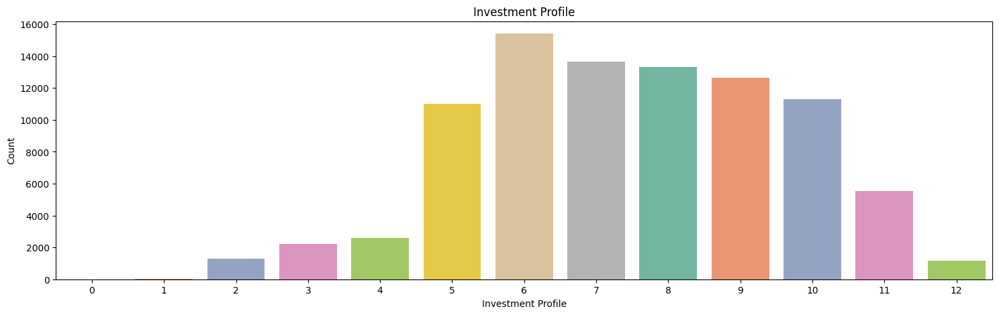

In [250]:
# Plotting
fig, ax = plt.subplots(figsize=(18, 5))

# Plot for investment_profile
sns.countplot(x='investment_profile', data=train_data, palette='Set2', ax=ax)
ax.set_title('Investment Profile')
ax.set_xlabel('Investment Profile')
ax.set_ylabel('Count')

### <font color=72beea> **2.3.4. PCA** </font>

In [251]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data[['log_investment_portfolio_value',
                                                      'investments_risk_appetite',
                                                      'log_investments_risk_tolerance']])
X_test_scaled = scaler.transform(test_data[['log_investment_portfolio_value',
                                                      'investments_risk_appetite',
                                                      'log_investments_risk_tolerance']])

pca = PCA(n_components=1)
train_data['investment_pca'] = pca.fit_transform(X_train_scaled)
test_data['investment_pca'] = pca.transform(X_test_scaled)

In [252]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data[['tech_savviness_score',
                                            'social_media_influence_score']])
X_test_scaled = scaler.transform(test_data[['tech_savviness_score',
                                            'social_media_influence_score']])

# Apply PCA
pca = PCA(n_components=1)
train_data['tech_pca'] = pca.fit_transform(X_train_scaled)
test_data['tech_pca'] = pca.transform(X_test_scaled)

In [253]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data[['log_avg_weekly_exercise_hours',
                                            'log_health_consciousness_rating',
                                            'stress_management_score']])
X_test_scaled = scaler.transform(test_data[['log_avg_weekly_exercise_hours',
                                            'log_health_consciousness_rating',
                                            'stress_management_score']])

# Apply PCA
pca = PCA(n_components=1)
train_data['health_pca'] = pca.fit_transform(X_train_scaled)
test_data['health_pca'] = pca.transform(X_test_scaled)

In [254]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data[['entertainment_engagement_factor',
                                            'log_avg_monthly_entertainment_expenses']])
X_test_scaled = scaler.transform(test_data[['entertainment_engagement_factor',
                                            'log_avg_monthly_entertainment_expenses']])

# Apply PCA
pca = PCA(n_components=1)
train_data['entertainment_pca'] = pca.fit_transform(X_train_scaled)
test_data['entertainment_pca'] = pca.transform(X_test_scaled)

---

In [255]:
# Drop all bins and encoded

train_data.drop('health_bins', axis=1, inplace=True)
train_data.drop('health_bins_encoded', axis=1, inplace=True)
train_data.drop('stress_bins', axis=1, inplace=True)
train_data.drop('stress_bins_encoded', axis=1, inplace=True)
train_data.drop('exercise_bins', axis=1, inplace=True)
train_data.drop('exercise_bins_encoded', axis=1, inplace=True)

train_data.drop('portfolio_value_bins', axis=1, inplace=True)
train_data.drop('portfolio_value_bins_encoded', axis=1, inplace=True)
train_data.drop('risk_appetite_bins', axis=1, inplace=True)
train_data.drop('risk_appetite_bins_encoded', axis=1, inplace=True)
train_data.drop('risk_tolerance_bins', axis=1, inplace=True)
train_data.drop('risk_tolerance_bins_encoded', axis=1, inplace=True)
train_data.drop('age_bins', axis=1, inplace=True)

########################################################################

test_data.drop('health_bins', axis=1, inplace=True)
test_data.drop('health_bins_encoded', axis=1, inplace=True)
test_data.drop('stress_bins', axis=1, inplace=True)
test_data.drop('stress_bins_encoded', axis=1, inplace=True)
test_data.drop('exercise_bins', axis=1, inplace=True)
test_data.drop('exercise_bins_encoded', axis=1, inplace=True)

test_data.drop('portfolio_value_bins', axis=1, inplace=True)
test_data.drop('portfolio_value_bins_encoded', axis=1, inplace=True)
test_data.drop('risk_appetite_bins', axis=1, inplace=True)
test_data.drop('risk_appetite_bins_encoded', axis=1, inplace=True)
test_data.drop('risk_tolerance_bins', axis=1, inplace=True)
test_data.drop('risk_tolerance_bins_encoded', axis=1, inplace=True)
test_data.drop('age_bins', axis=1, inplace=True)

In [256]:
train_data.info()
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90160 entries, 0 to 90164
Data columns (total 30 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   citizen_id                               90160 non-null  int64  
 1   last_year_avg_monthly_charity_donations  90160 non-null  float64
 2   environmental_awareness_rating           90160 non-null  float64
 3   investment_portfolio_value               90160 non-null  float64
 4   investments_risk_appetite                90160 non-null  float64
 5   investments_risk_tolerance               90160 non-null  float64
 6   tech_savviness_score                     90160 non-null  float64
 7   social_media_influence_score             90160 non-null  float64
 8   entertainment_engagement_factor          90160 non-null  float64
 9   avg_monthly_entertainment_expenses       90160 non-null  float64
 10  avg_weekly_exercise_hours                90160 non-

## <font color=72beea> **Save data in new csv file** </font>

### ***train_data* as *clean_train***

In [257]:
file_path = '/content/drive/MyDrive/Homework_Group06/DM2_Project Datasets/clean_train.csv'

# Export to CSV
train_data.to_csv(file_path, index=False)

### ***test_data* as *clean_test***

In [258]:
file_path = '/content/drive/MyDrive/Homework_Group06/DM2_Project Datasets/clean_test.csv'

# Export to CSV
test_data.to_csv(file_path, index=False)